# Demand prediction baseline solution

Victor Kantor, xead.wl@gmail.com

In [1]:
import pandas as pd

train = pd.read_csv("train.tsv")
test = pd.read_csv("test.tsv")
sample_submission = pd.read_csv("sample_submission.tsv")

In [3]:
frac = 0.1 # fraction of learning examples used for model fitting

# sample the train set if your don't want to deel with all examples
train = train.sample(frac=frac, random_state=42)

X = train.drop(['Num','y','f1','f2','f3','f4','f5','f6','f7','f8','f9',
                'f10','f11','f12','f13','f14','f15','f16','f17','f18',
                'f19','f20','f21','f22','f23','f24','f25','f26','f27',
                'f28','f29','f30'], axis=1)
y = train['y']
print (len(X), len(y))

7246 7246


In [4]:
%%time
from sklearn.ensemble import GradientBoostingRegressor

model = GradientBoostingRegressor(n_estimators=100, max_depth=5, random_state=43)
model.fit(X, y)

preds = model.predict(test.drop(['Num','f1','f2','f3','f4','f5','f6','f7','f8','f9',
                                'f10','f11','f12','f13','f14','f15','f16','f17','f18',
                                'f19','f20','f21','f22','f23','f24','f25','f26','f27',
                                'f28','f29','f30'], axis=1))

print (len(preds))
print (len(sample_submission))

2016
2016
Wall time: 2.73 s


In [85]:
sample_submission['y'] = preds

In [86]:
sample_submission.head(5)

,Num,y
0,348622,3098.119369
1,348623,31132.837802
2,348624,334972.050497
3,348625,40890.440505
4,348626,3098.119369


In [77]:
sample_submission.head(5)

,Num,y
0,348622,3098.119369
1,348623,31132.837802
2,348624,334972.050497
3,348625,40890.440505
4,348626,3098.119369


In [87]:
# In GBM you can get some negative predictions:
print (sample_submission[sample_submission['y'] < 0])

Empty DataFrame
Columns: [Num, y]
Index: []


In [88]:
sample_submission['y'] = sample_submission['y'].map(lambda x: x if x > 0 else 0.0)

In [89]:
sample_submission.to_csv("baseline_submission.tsv", sep=',', index=False)

In [37]:
train

,Num,y,year,week,shift,item_id,f1,f2,f3,f4,...,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60
0,0,123438,2012,52,1,20442076,4915.0,38056.0,40185.0,45733.0,...,39423.0,41765.0,52590.0,31452.0,44420.0,41865.0,52705.0,36102.0,44163.0,45239.0
1,1,58410,2012,52,1,20441997,2230.0,18817.0,20110.0,26368.0,...,22830.0,25230.0,27850.0,21390.0,27090.0,23170.0,29705.0,19140.0,22055.0,23200.0
2,2,163930,2012,52,1,20441990,5695.0,47480.0,47619.0,89708.0,...,14930.0,44290.0,46412.0,29320.0,21140.0,28406.0,65056.0,31886.0,48750.0,36520.0
3,3,53902,2012,52,1,20441989,1995.0,17146.0,20066.0,27070.0,...,15120.0,12480.0,19780.0,7990.0,8230.0,10650.0,21920.0,13040.0,9780.0,9630.0
4,4,105970,2012,52,1,20441988,6515.0,49262.0,50045.0,95167.0,...,18872.0,19328.0,37168.0,13570.0,19760.0,20208.0,34745.0,18442.0,24700.0,21793.0
5,5,21171,2012,52,1,20441953,445.0,3020.0,2395.0,4015.0,...,8796.0,7690.0,13448.0,3455.0,7205.0,8490.0,10790.0,7855.0,8150.0,7505.0
6,6,63128,2012,52,1,20441952,445.0,3930.0,4260.0,6836.0,...,11754.0,8064.0,15275.0,4991.0,9025.0,12236.0,19830.0,8465.0,10770.0,13145.0
7,7,44001,2012,52,1,20441951,1167.0,15220.0,12310.0,17270.0,...,21102.0,20376.0,25385.0,11685.0,21389.0,16685.0,22805.0,14495.0,16462.0,19383.0
8,8,53202,2012,52,1,20441790,1640.0,22010.0,17716.0,21941.0,...,18301.0,17758.0,26181.0,11090.0,17705.0,17225.0,23385.0,13711.0,17175.0,22406.0
9,9,36627,2012,52,1,20441789,1440.0,14601.0,12127.0,17498.0,...,13531.0,15015.0,18574.0,9146.0,14865.0,13051.0,17389.0,10739.0,13260.0,15570.0


In [5]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

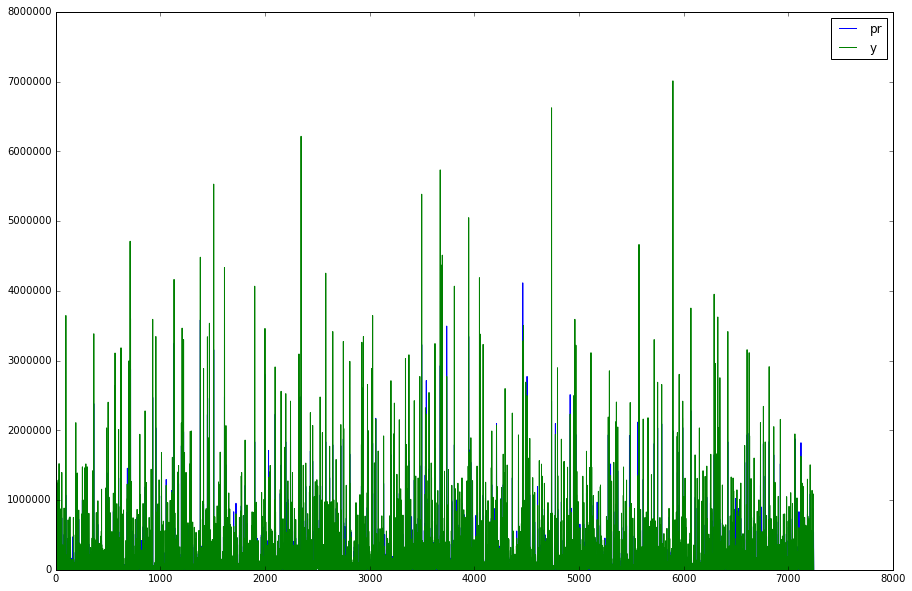

In [38]:
plt.figure(figsize=(15, 10))
sz = -1
plt.plot(range(len(X))[:sz], X['f60'][:sz], label='pr')
plt.plot(range(len(y))[:sz], y[:sz], label='y')
plt.legend(loc='best')
plt.show()
#plt.plot(X['f60'], y)

In [183]:
def get_feature_times(fr):
    return np.array(fr['year'])*53 + (np.array(fr['week']) - 1) - np.array(fr['shift'])
 
def get_y_times(fr):
    return np.array(fr['year'])*53 + (np.array(fr['week']) - 1)

def get_real_times(ddd, ddd1):
    return 'str'

def get_times(dd, dd1):
    return 'str'
 
def print_cluster_field(train,_id,field='y',time_shift=1,norm=False,offset=0):
    trainC = train[train['item_id'] == _id][train['shift'] == time_shift]
#     trainC[('year','week','shift')].head()
    data = np.array(trainC[field])
    #print(np.mean(data), np.std(data))
    if norm:
        data = (data - np.mean(data))/np.std(data)
    timeC = get_y_times(trainC)
    prepared = []
#     print(len(np.unique(timeC)), len(timeC))
    for i in range(len(timeC)):
        prepared.append((timeC[i],data[i]))
#     prepared = np.array(prepared)
    prepared = np.array(sorted(prepared))
    ox = prepared[:,0]
    oy = prepared[:,1]
    plt.plot(ox-offset,oy,label=field)

163653.990741 41801.6379534
101971.185185 25851.8043855


C:\Users\Andrey\Anaconda3\lib\site-packages\ipykernel\__main__.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


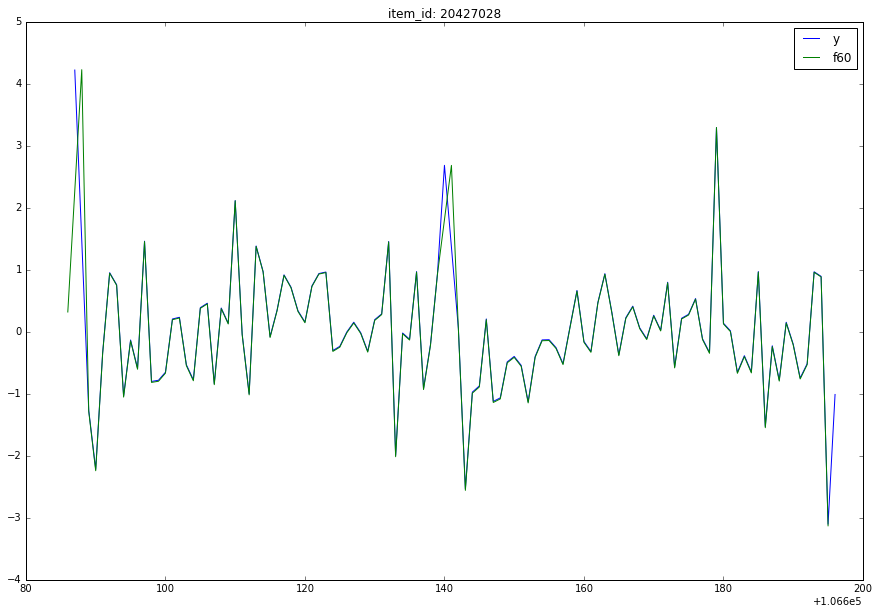

3910.2962963 2662.61138268
2425.75925926 1655.52890659


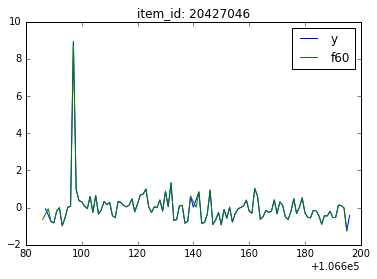

365.5 721.410684007
72.1875 208.093794583


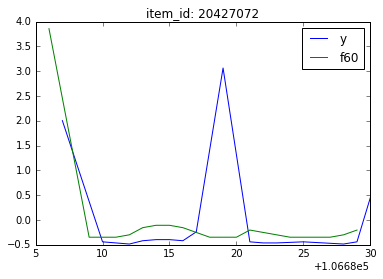

558.514018692 393.571767007
350.46728972 244.28183194


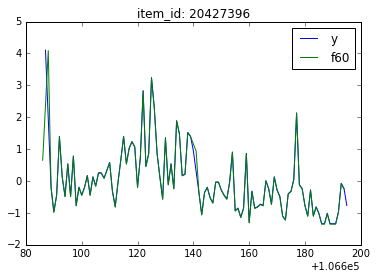

18.6666666667 6.95381589888
1.33333333333 3.3993463424


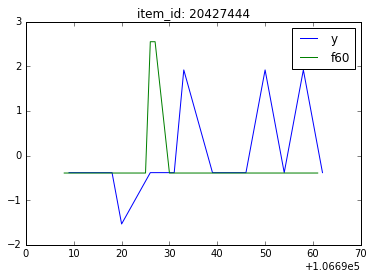

95364.2592593 22842.5915692
59245.8611111 14188.1421424


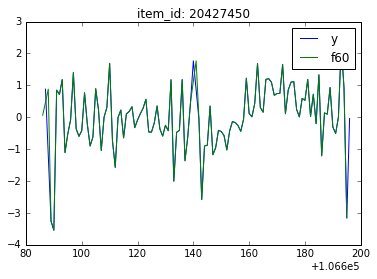

13571.712963 3615.17518158
8439.11111111 2245.34421734


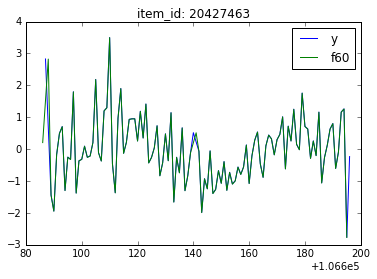

1498.35185185 579.377480654
923.481481481 346.520842232


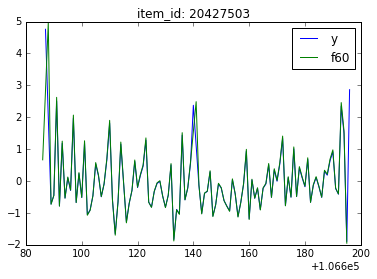

964.638888889 412.931019671
593.777777778 248.265178318


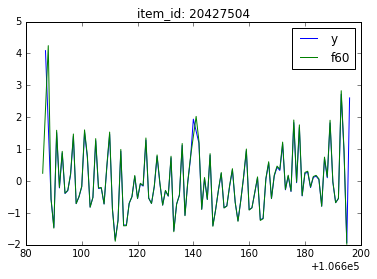

201866.166667 46559.3921049
126023.027778 28650.9759482


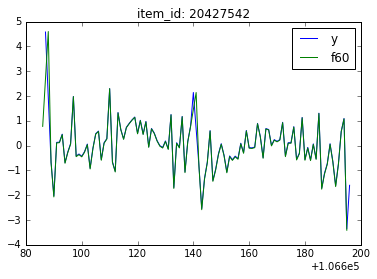

1270595.65741 411190.834542
797751.138889 257642.315978


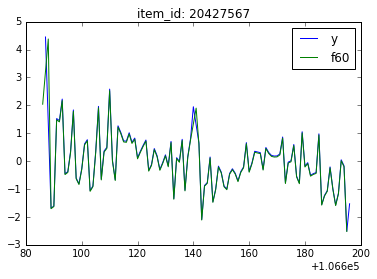

143187.777778 46802.1667493
89681.8240741 28983.7232936


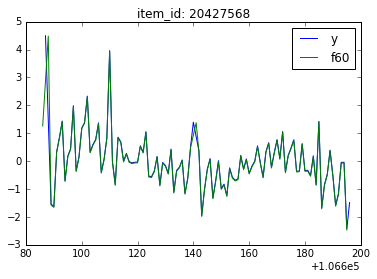

3576.94444444 1250.29623774
2225.48148148 775.049120086


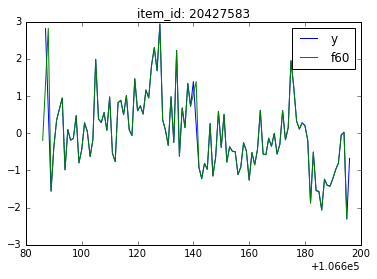

55982.6574074 53268.0061829
35366.4166667 33321.008646


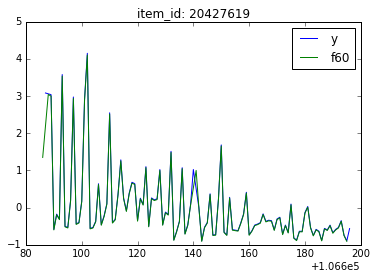

99.0 97.5260648921
35.0 54.3905629069


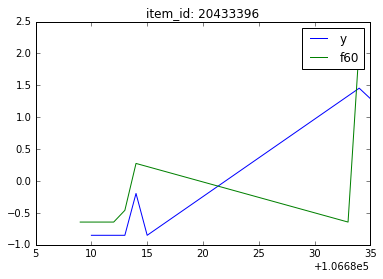

478.601851852 320.207078247
303.287037037 201.17842877


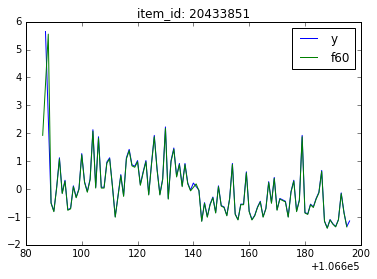

471.299065421 330.462921272
296.635514019 204.532491422


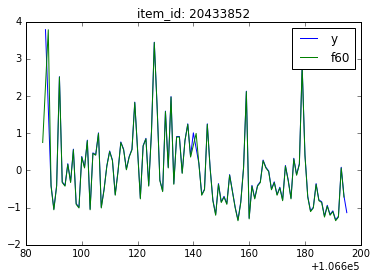

132654.722222 37561.4381905
82754.1388889 23208.5504927


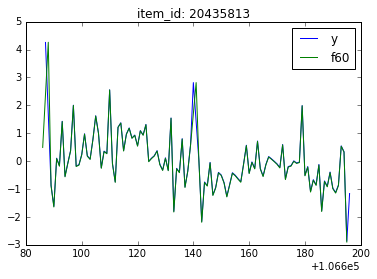

238220.342593 59797.2716401
148477.296296 36962.4481583


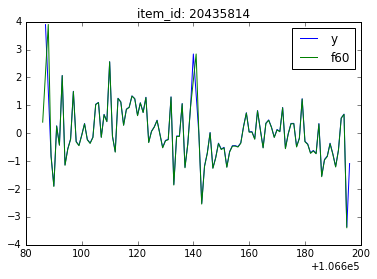

151577.916667 34509.0103245
94394.6759259 21297.2469008


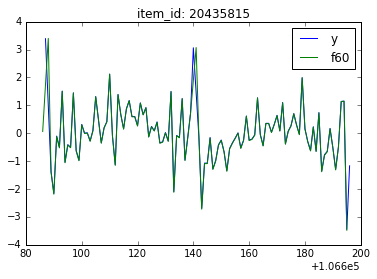

324459.314815 75922.9221994
201545.768519 47139.9096421


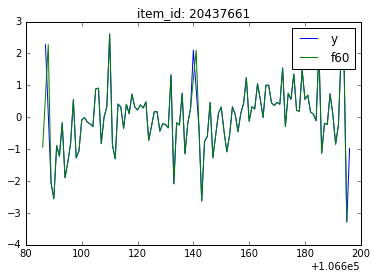

414824.675926 94612.0368075
257563.898148 58816.0999941


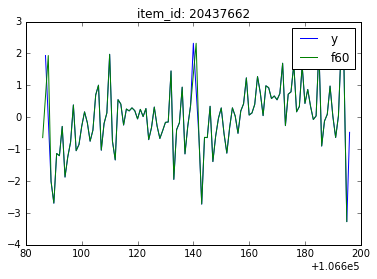

29752.1666667 12766.9499312
18574.2037037 7869.52257689


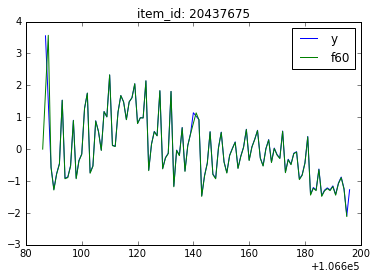

17390.4166667 6471.60053208
10847.9444444 3983.15337305


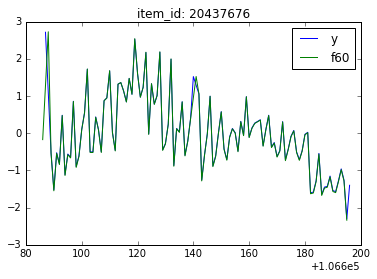

16.0 0.0
0.0 0.0


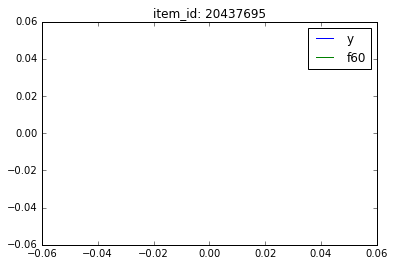

60599.2037037 40337.1663702
38028.6851852 24961.6112927


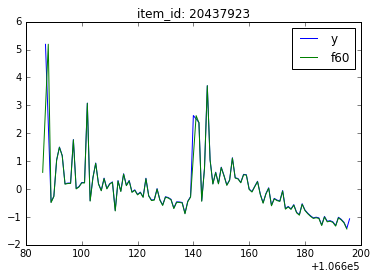

7008.2037037 4633.19490752
4436.90740741 2911.98797927


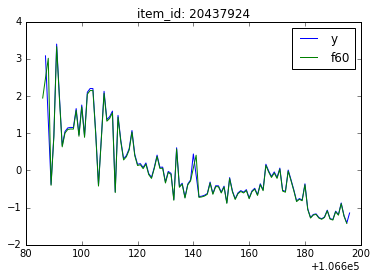

12155.6296296 9291.97025572
7646.98148148 5776.90181124


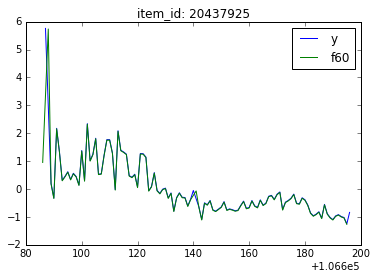

8647.8125 8140.20168069
5642.15625 4994.23534631


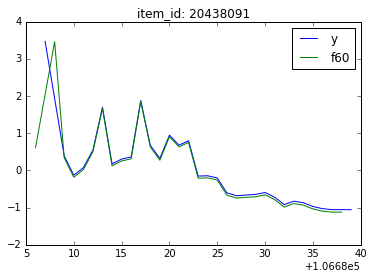

101568.851852 28968.0767704
63457.7037037 17847.0011311


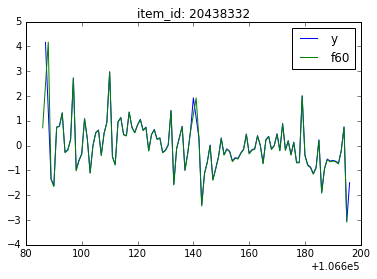

36805.5740741 12190.6168806
23029.7777778 7532.79252279


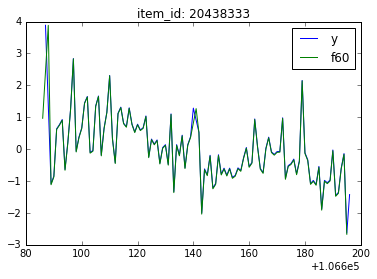

1203076.92593 486264.851213
752185.138889 300642.414974


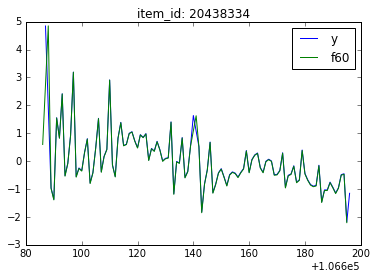

49843.3703704 17262.5826351
31164.9814815 10693.2533386


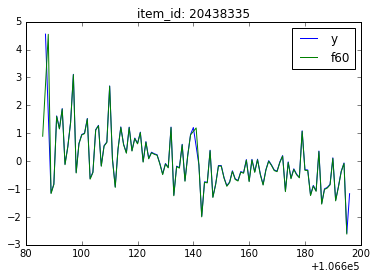

124700.833333 95440.8520364
77863.3888889 59059.2820415


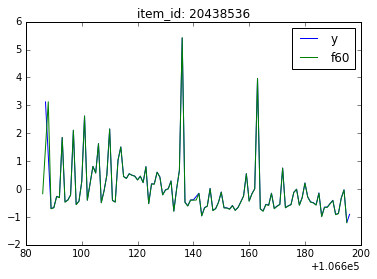

89680.6388889 65469.0906131
56076.3240741 40487.3622715


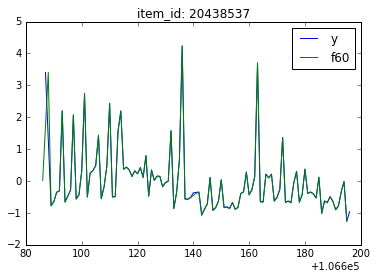

1227562.68519 342237.326798
771795.638889 217270.303869


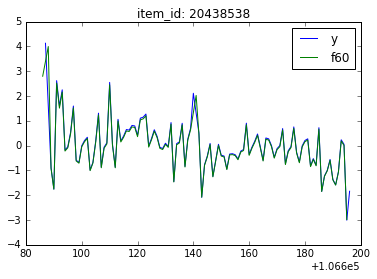

954484.194444 296204.514784
599860.916667 187638.755931


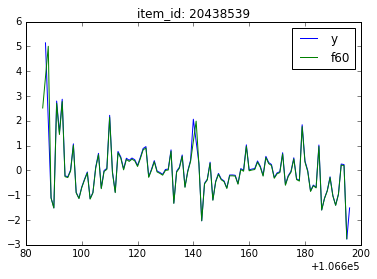

963306.333333 273413.371917
603059.12963 169432.305301


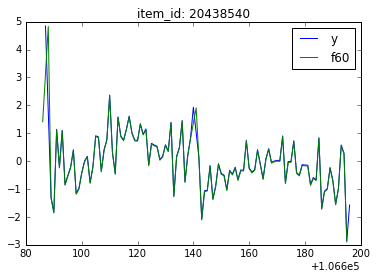

2307781.24074 744592.106032
1445863.63889 458085.313444


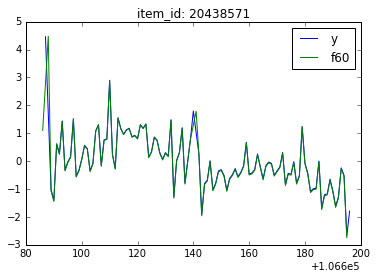

218896.509259 57882.4715074
137195.546296 35824.0786836


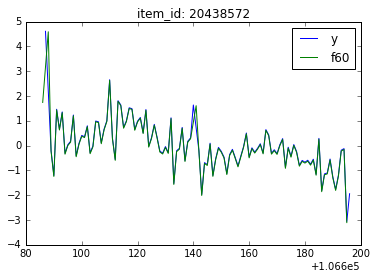

31.6666666667 44.0687594057
12.0833333333 12.8222354612


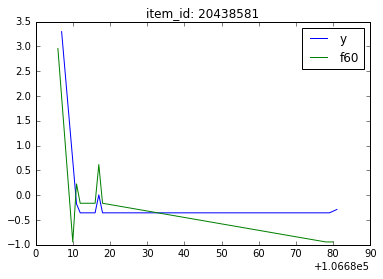

143832.833333 34157.5290929
89595.5648148 21208.608469


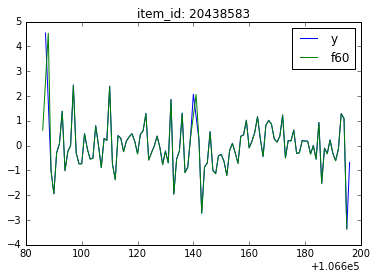

3183.75925926 1746.49973688
1999.2037037 1098.15083427


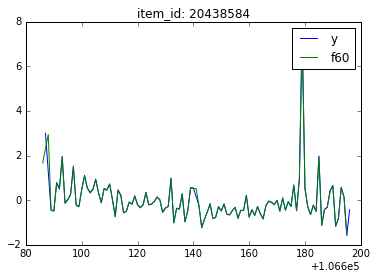

13898.5833333 5271.24392538
8702.56481481 3272.85540263


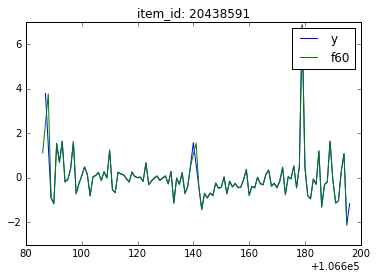

2771.86111111 1182.52173622
1738.96296296 717.353003731


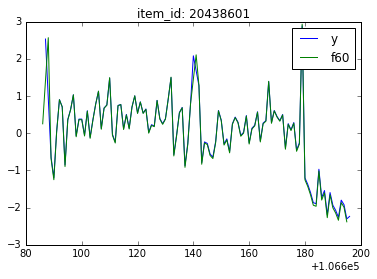

18553.0648148 4705.28920328
11606.4722222 2974.61126454


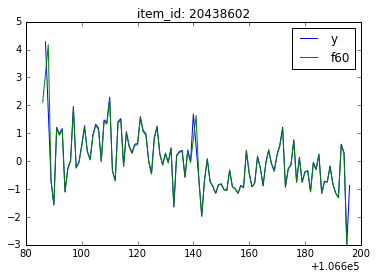

140382.0 47292.123924
87734.9074074 29292.5322586


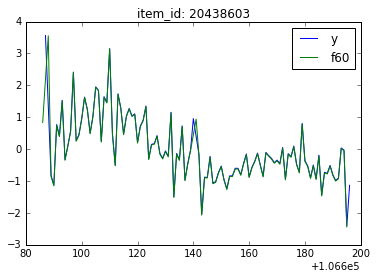

5603.42592593 2030.82115851
3508.19444444 1269.907473


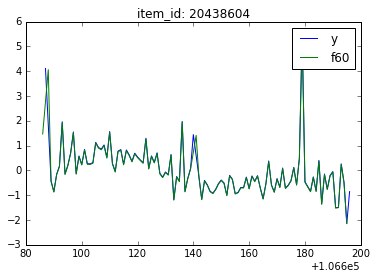

3964843.77778 1254254.73526
2485956.72222 783658.350206


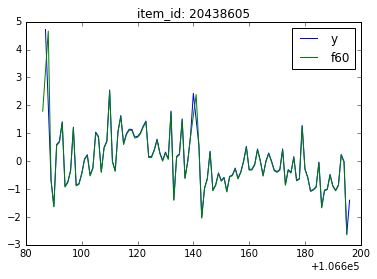

665425.472222 183792.855827
416007.527778 113847.511745


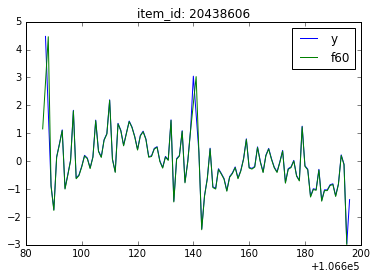

151687.972222 37978.3817165
94688.8981481 23448.567041


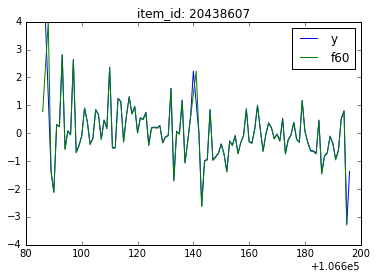

731023.712963 175378.638338
454785.555556 108523.243783


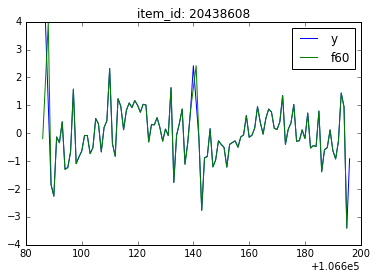

318084.314815 72673.477907
197802.861111 44994.7634201


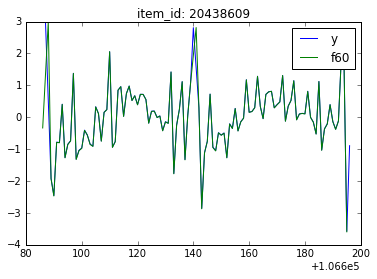

115651.0 26260.2360409
71878.3703704 16276.1204607


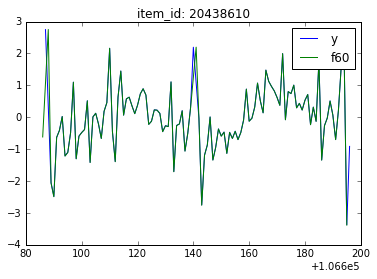

65423.7592593 16192.2103671
40652.4444444 10051.0511099


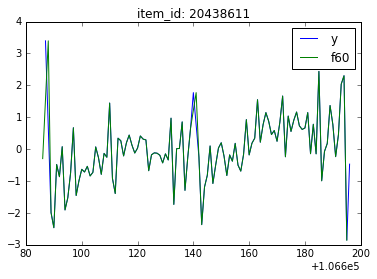

7912.56481481 5365.15463219
4988.61111111 3321.71315637


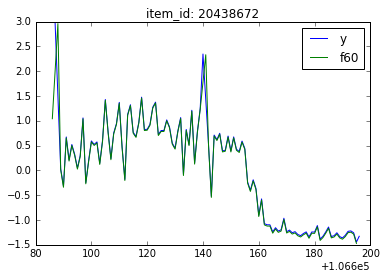

17694.4166667 4945.33728791
11012.0925926 3079.33124816


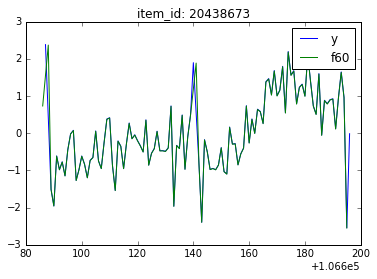

333134.12963 73967.9423546
207504.222222 45974.7447252


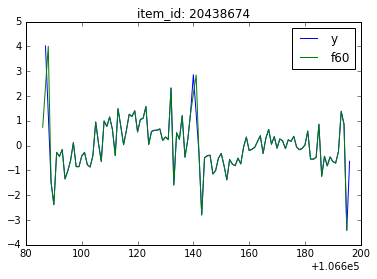

848475.805556 182769.425309
527833.638889 113439.419344


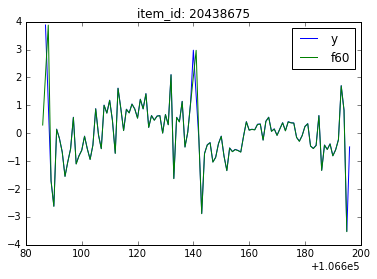

397250.574074 83538.451203
247193.212963 51722.8058348


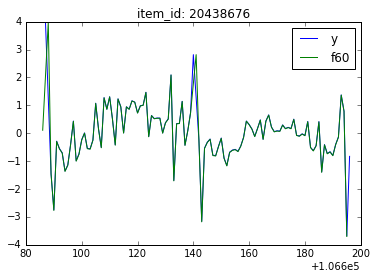

21370.6481481 4660.46547372
13283.3703704 2899.84455392


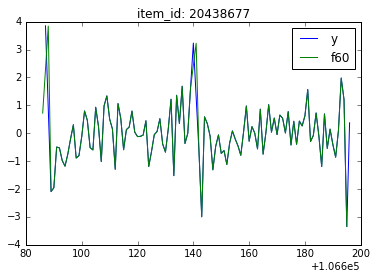

39005.0185185 9531.37713902
24352.1296296 5950.45553826


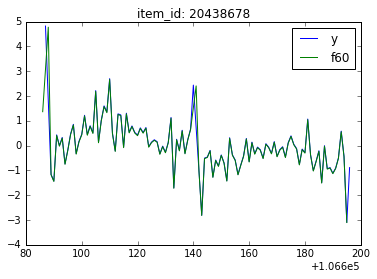

31596.4259259 6883.73721065
19702.3055556 4207.1102149


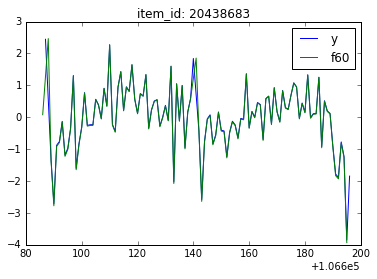

19402.7592593 6648.90224422
11948.9444444 4041.9242732


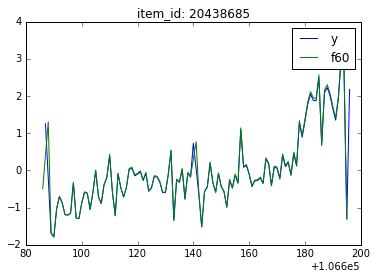

21284.3611111 4525.04827365
13223.7407407 2811.4147828


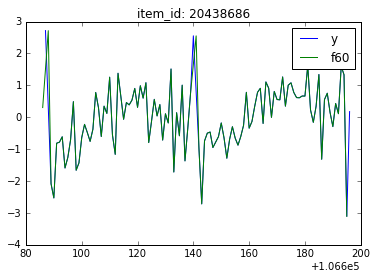

32345.1308411 17400.3331556
20481.0186916 10832.526305


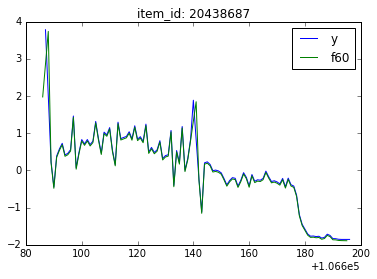

39679.047619 20254.1303449
24969.8 12379.7000413


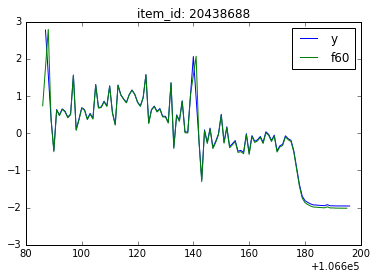

1876.60869565 1857.38600187
1197.7173913 1168.57061819


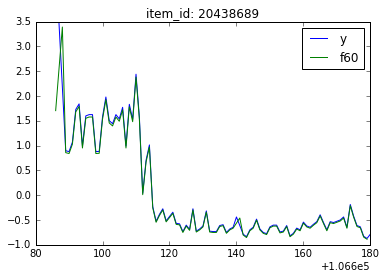

790.194444444 268.072421749
495.62962963 171.887430465


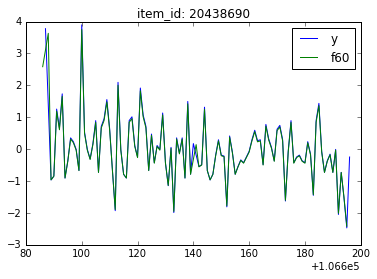

127.171428571 126.910876651
79.4285714286 79.9503247133


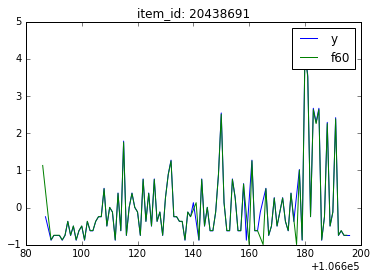

16.0 0.0
0.0 0.0


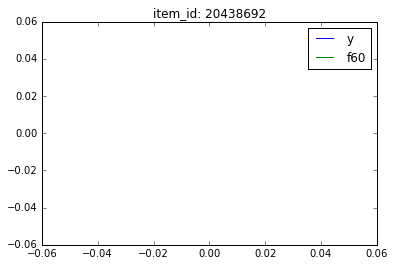

173922.259259 45543.5729524
108717.796296 28403.7919357


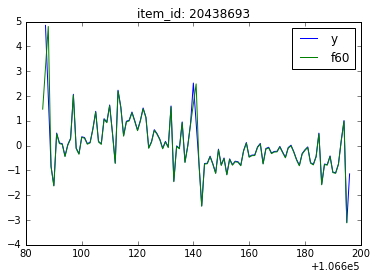

1052066.25 291290.75518
659894.083333 184677.694084


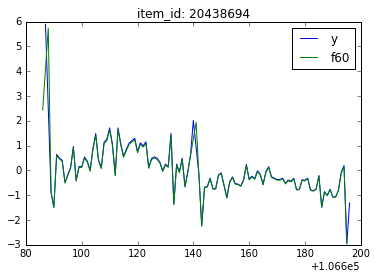

16.0 0.0
0.0 0.0


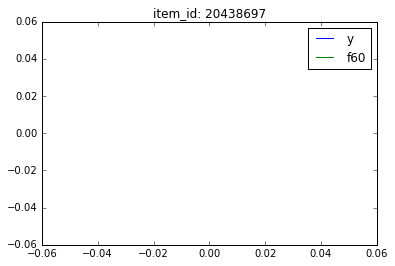

431635.962963 106349.786077
269684.25 65677.821113


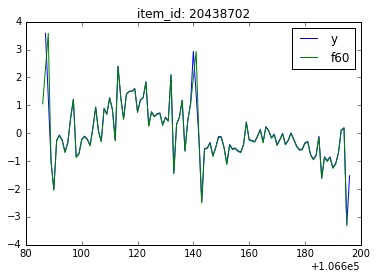

959273.888889 244415.301287
600808.537037 152831.863396


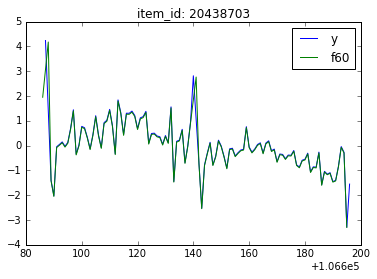

40618.4166667 10441.162078
25384.8333333 6531.76300076


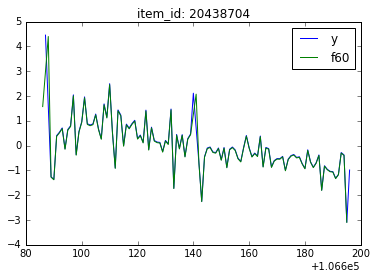

9426.91666667 3686.05061943
5931.60185185 2275.49661629


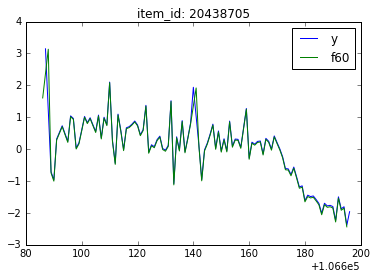

42167.712963 8849.53704277
26276.0740741 5512.76175444


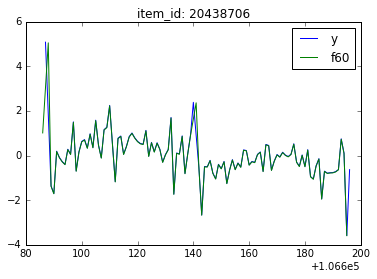

672086.166667 149994.445834
419100.194444 93410.3684714


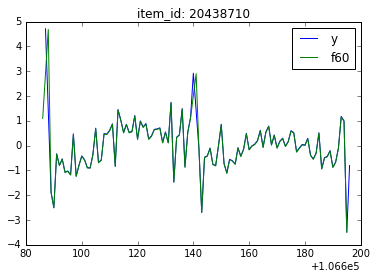

165329.648148 33072.4355926
102881.314815 20553.8034737


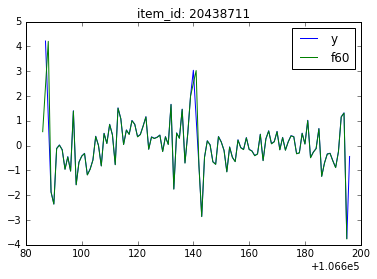

760028.777778 201711.096715
475467.62963 127425.19678


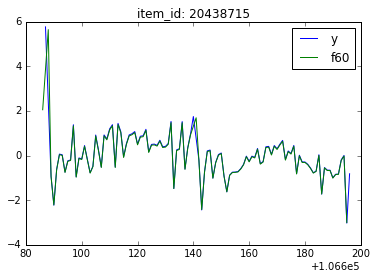

337233.203704 93475.5198159
211802.861111 61289.0868347


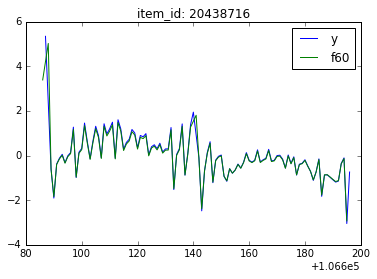

94.5066666667 104.969630317
57.84 66.8564711403


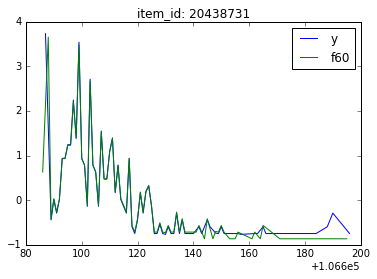

145.094594595 181.827670784
89.7027027027 118.068547398


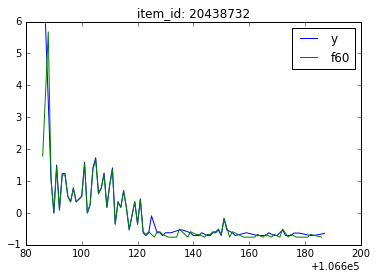

6574.57407407 2213.42734993
4100.93518519 1367.66505046


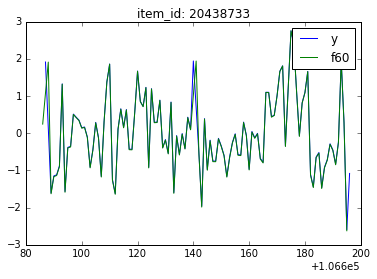

847.805555556 359.532913507
530.87962963 223.70788317


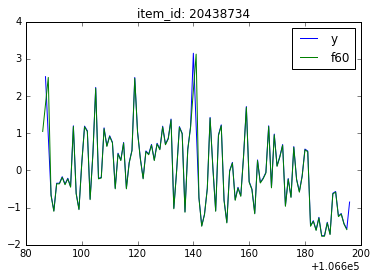

4603.62222222 4039.70435821
2960.48888889 2484.24243424


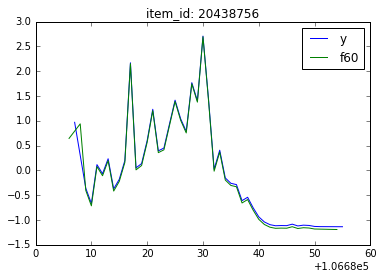

31020.9537037 12968.8533342
19342.5925926 8018.53908376


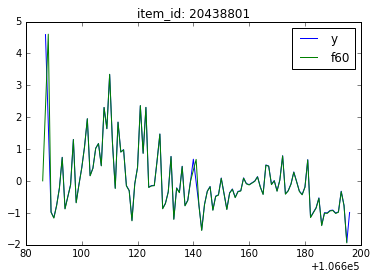

39515.6574074 15708.0979824
24706.3518519 9688.52005508


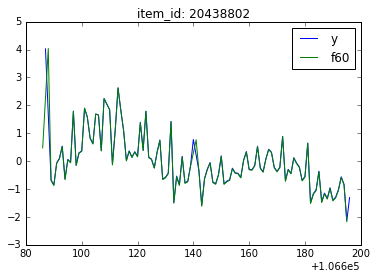

102478.990741 53404.4116402
64210.5 33090.3351859


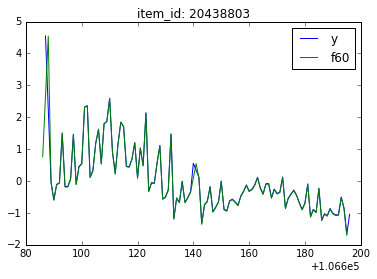

10915.7314815 4452.14700517
6814.78703704 2751.81101328


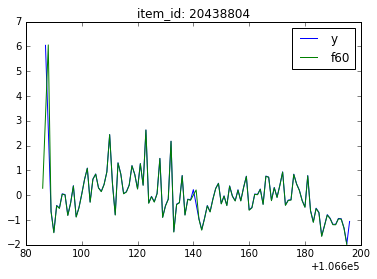

886.064814815 510.157787377
554.962962963 314.585203848


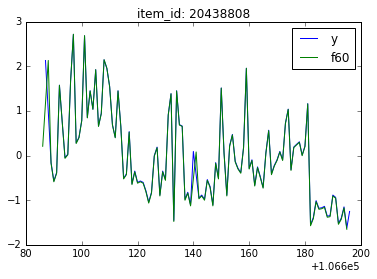

909.388888889 610.914703286
573.592592593 379.699809231


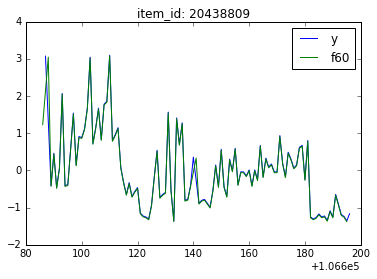

726.287037037 420.964282177
455.055555556 258.908743874


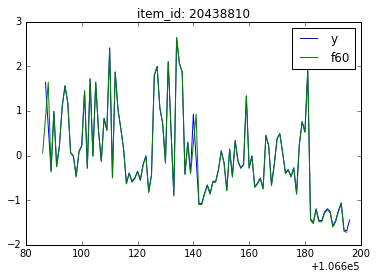

71.3787878788 98.1644824295
40.6060606061 61.6042793643


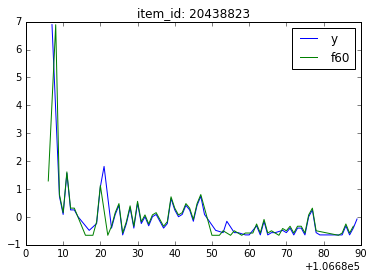

1303.02777778 616.895655057
812.157407407 380.280699495


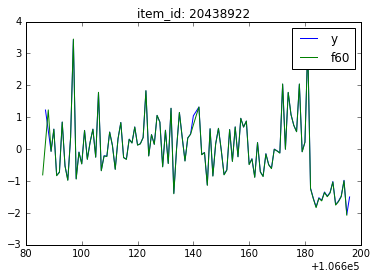

2521.61111111 1493.54028721
1579.55555556 916.071769925


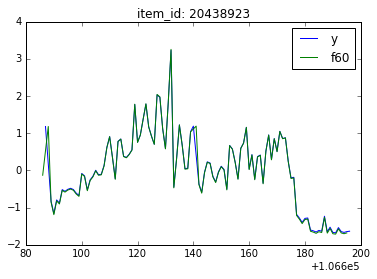

635.865384615 801.895351624
409.423076923 501.494548868


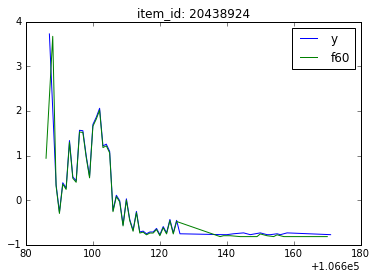

1031.52777778 461.797423487
643.675925926 284.067116114


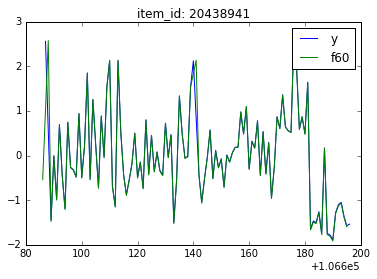

367.070707071 302.154126585
222.727272727 187.615651507


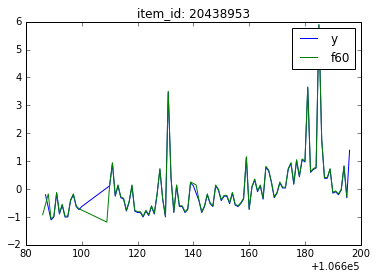

445.801980198 453.254043683
281.356435644 283.546583532


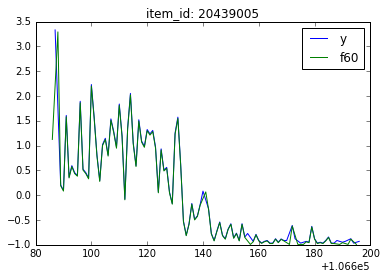

82.7916666667 60.0388618359
44.0625 46.8670132085


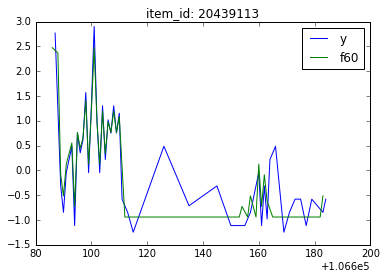

146.1875 92.292143998
92.34375 64.4930274211


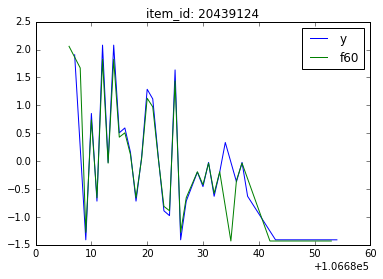

3.0 0.0
0.0 0.0


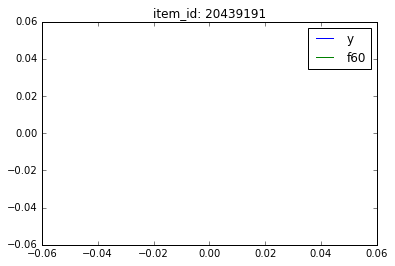

72.6428571429 96.9798264316
30.7142857143 63.8596995334


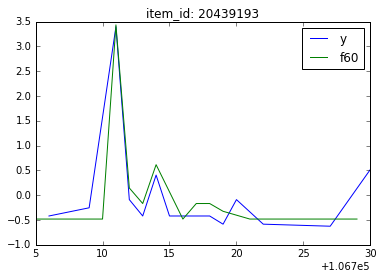

1736.26851852 897.903325309
1076.80555556 557.696227853


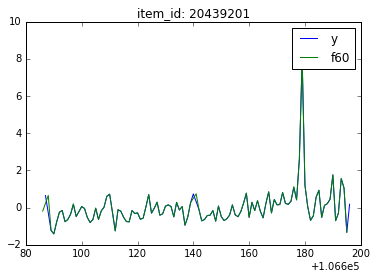

1529.51851852 915.522927697
953.231481481 568.156759903


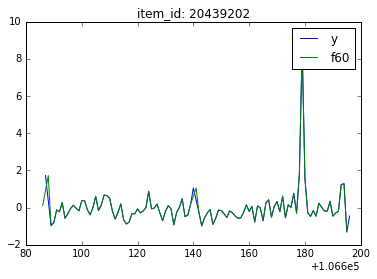

127435.25 41453.8661399
79427.6944444 25627.9141774


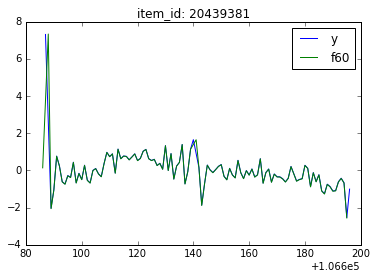

14.0 0.0
0.0 0.0


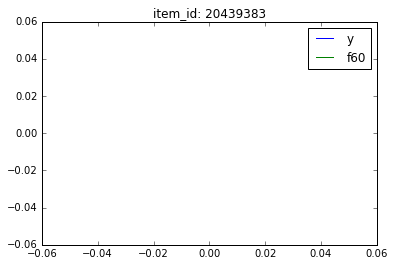

15.5 0.866025403784
0.0 0.0


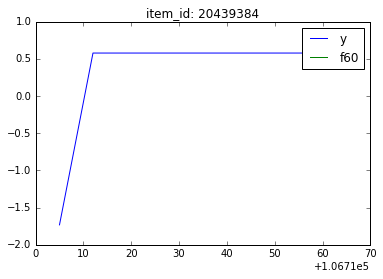

485.351851852 317.938857237
306.888888889 193.712718436


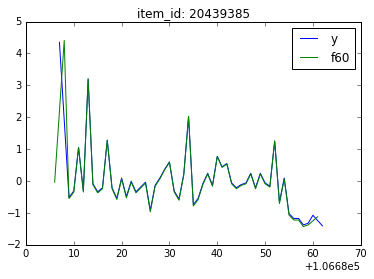

539.660377358 402.131675769
336.79245283 250.712370603


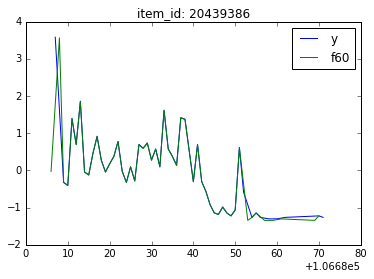

11494.1851852 3134.38870273
7190.75 1947.5935965


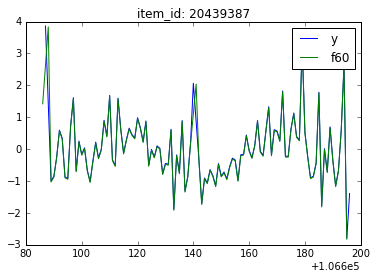

2462.5462963 955.931263842
1539.11111111 590.16277311


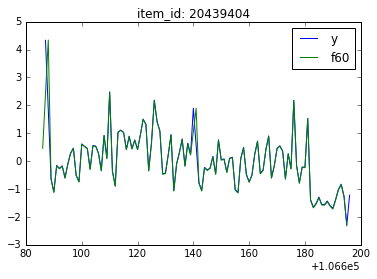

5043.46296296 1391.50008601
3141.08333333 858.401616755


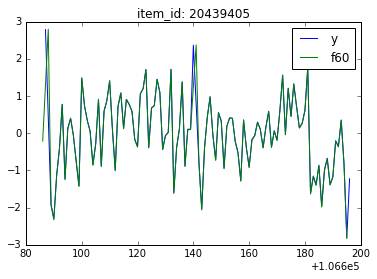

431.411764706 496.493475915
291.323529412 322.383834125


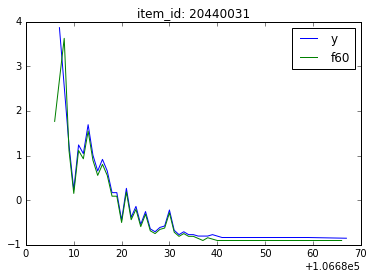

29.3636363636 17.1981644225
7.68181818182 13.0432370621


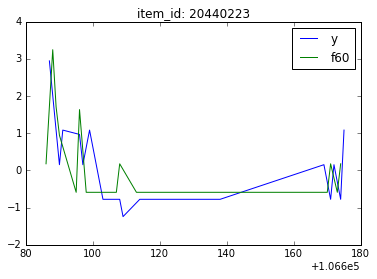

42.7931034483 54.3262045809
15.3103448276 31.8066393506


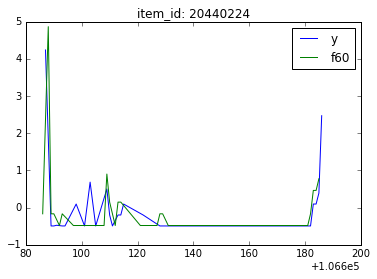

36.15625 31.788470173
21.34375 36.4739713486


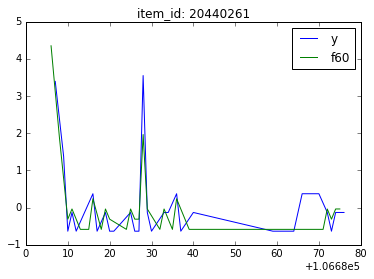

48.1 60.5581538688
35.0 53.1507290637


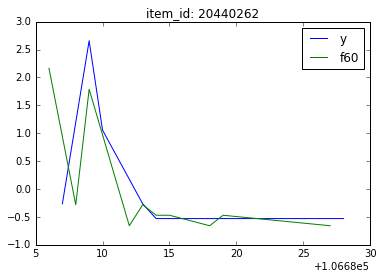

3206.22222222 1259.70026074
2012.63888889 777.854759583


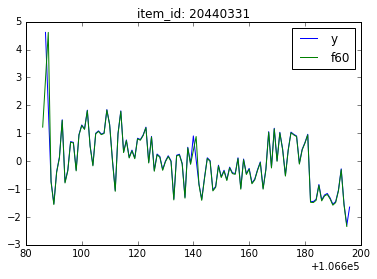

1954.59259259 834.894582357
1224.67592593 513.347236982


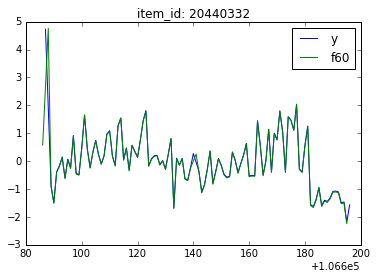

4927.07407407 2211.11000993
3083.60185185 1363.86415189


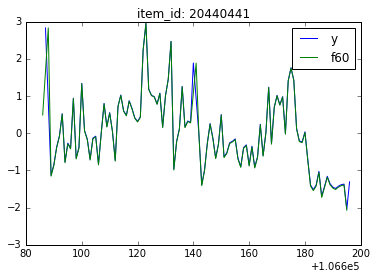

6526.19444444 2912.66491334
4069.53703704 1800.31318996


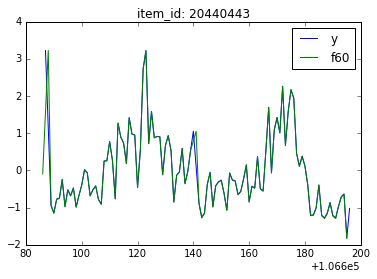

880290.046296 224955.029871
546718.925926 139732.206965


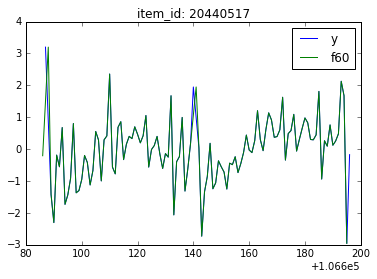

491269.712963 127106.837083
305194.574074 78941.5943472


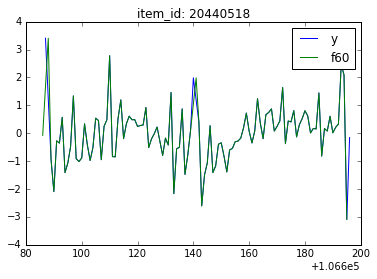

1868269.66667 780032.131631
1169060.75926 483059.016076


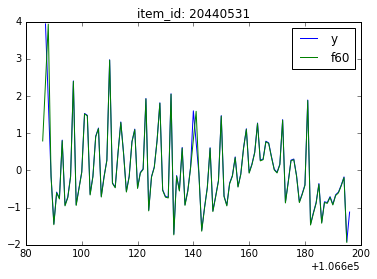

624264.138889 265475.490312
389927.898148 163968.252026


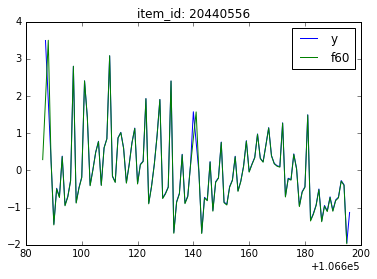

50230.4814815 29289.9225245
31627.962963 18305.2950505


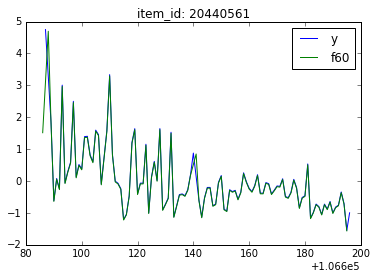

35397.4722222 20279.7154938
22154.9537037 12552.7340997


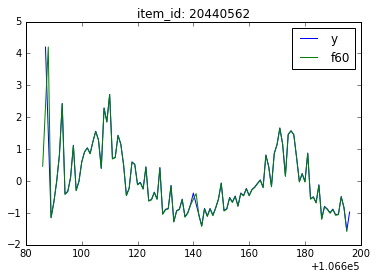

32.0 0.0
20.0 11.5470053838


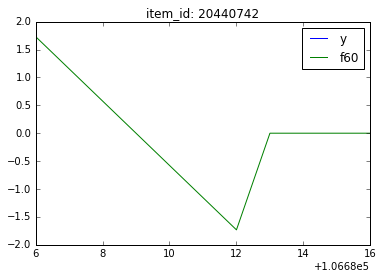

10837.9074074 5392.87164542
6794.51851852 3301.85806973


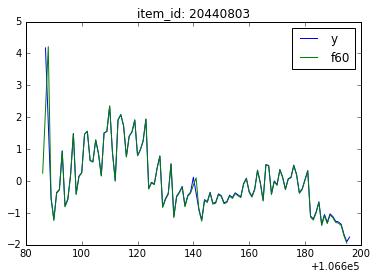

42294.1851852 18451.2201625
26285.1481481 11450.0325956


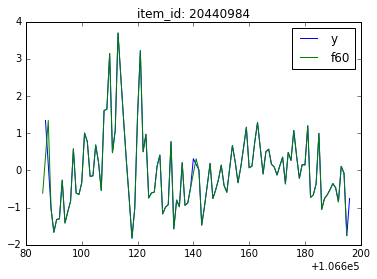

56397.1759259 20066.7619045
34955.7037037 12529.1403634


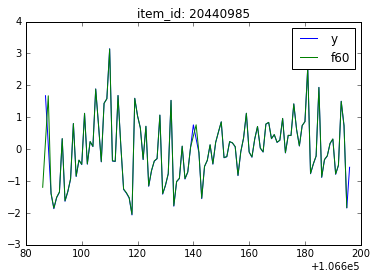

106748.824074 40967.6812809
66248.8796296 25489.6570726


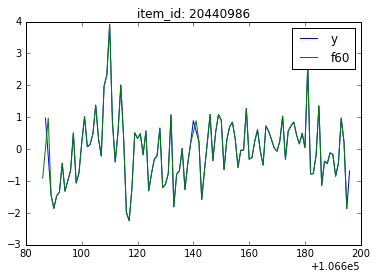

318029.916667 78861.0767783
198862.314815 49368.6875775


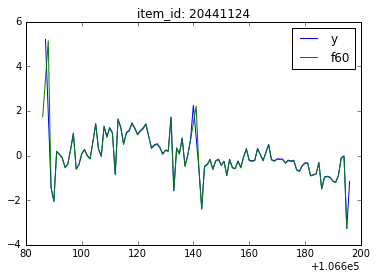

118149.944444 26919.1710228
73651.9444444 16718.98528


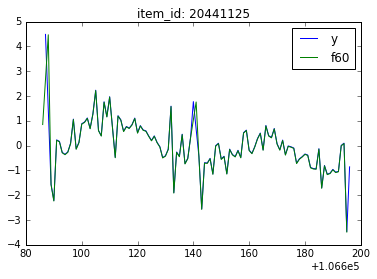

14663.1388889 7283.74013923
9260.7962963 4495.26691573


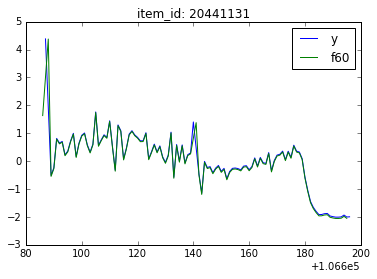

310552.416667 83488.9904382
192897.296296 51851.7634957


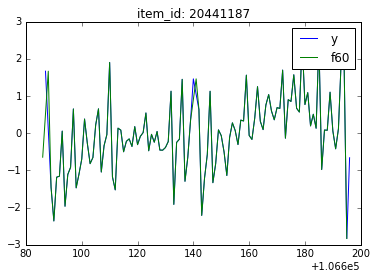

64.0 35.0542436803
50.0 62.2896460096


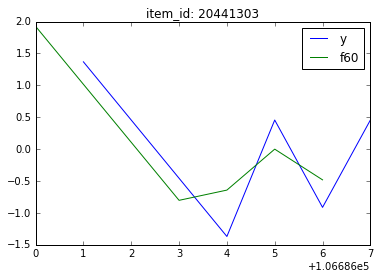

155.5 115.96874579
111.8125 81.143560088


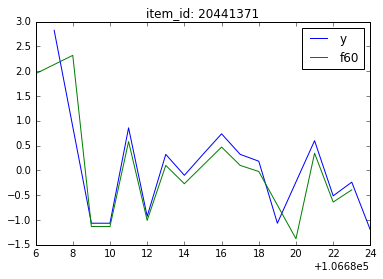

17700.3148148 9483.46347074
10986.037037 5892.79449354


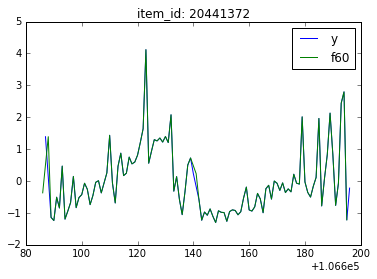

16916.287037 6653.04808319
10601.4814815 4159.50934936


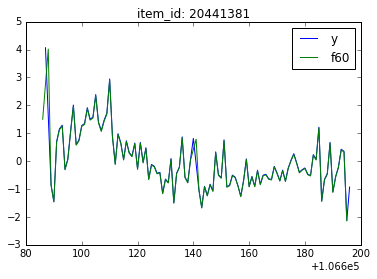

28027.6296296 7722.53361753
17496.8888889 4812.63807754


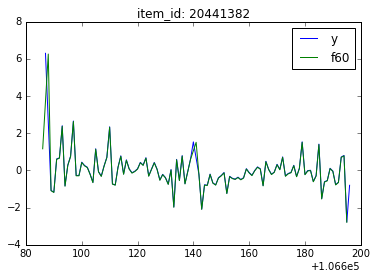

315.476190476 420.020742388
198.650793651 260.753496604


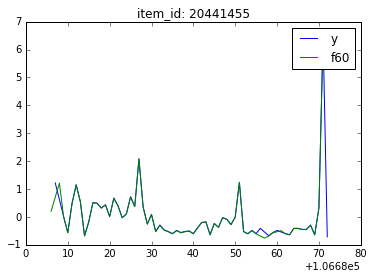

314.412698413 205.997352034
197.142857143 126.690831923


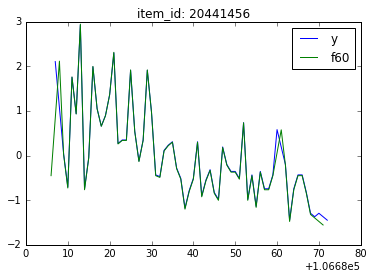

112.5 80.5
0.0 0.0


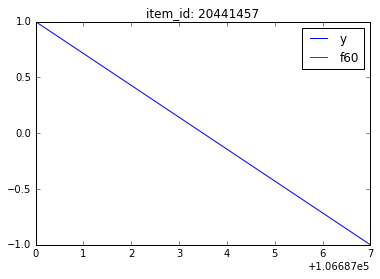

6930.18918919 8295.34208551
4421.35135135 5107.19398928


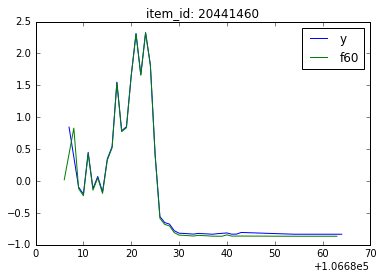

13379.92 8145.8877376
8766.64 4797.82414751


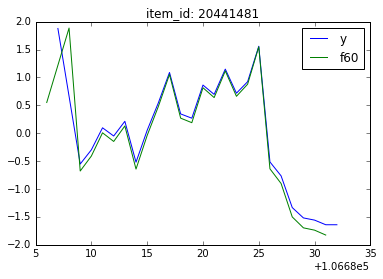

7894.48571429 4993.83301037
5088.14285714 2996.69343628


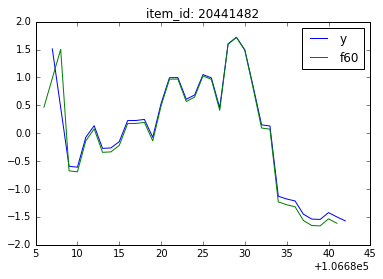

34994.6018519 9705.43438734
21885.8148148 5995.21771783


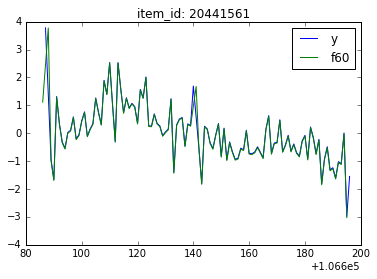

382865.296296 137849.959853
239981.916667 86802.4458168


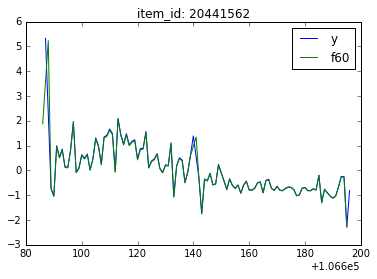

30581.037037 8477.53987717
19215.3055556 5249.7266339


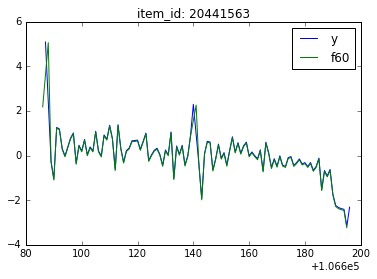

5557.2 3133.80742229
3859.0 1886.90990776


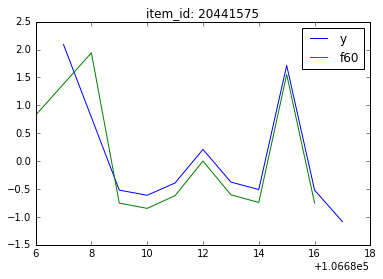

10619.6363636 8441.42338033
6690.45454545 5191.17737326


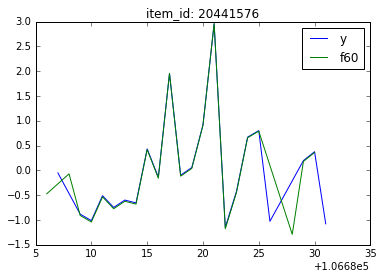

193.516129032 277.871387164
120.451612903 173.390634623


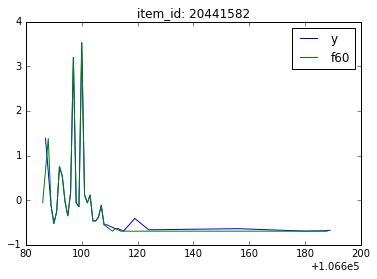

120.653846154 127.00603932
77.3076923077 78.5257278911


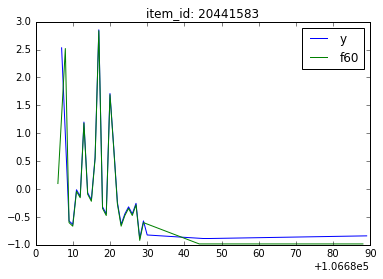

119.625 150.767650293
75.375 94.8901173727


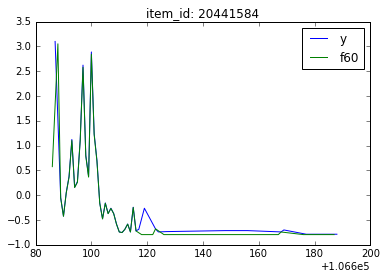

42901.3888889 14077.5701803
26907.25 8849.56735511


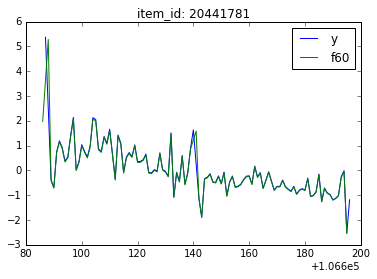

16644.3148148 4446.18119674
10413.5 2792.40553572


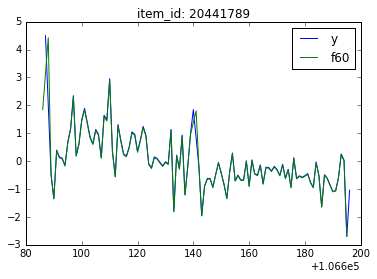

17920.3611111 9387.68980718
11320.787037 5861.03891064


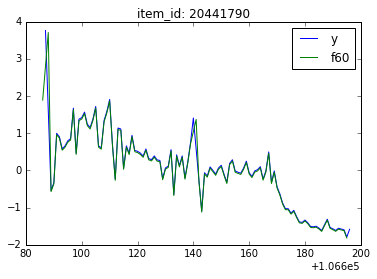

47406.3611111 11643.45203
29360.0555556 7295.49482219


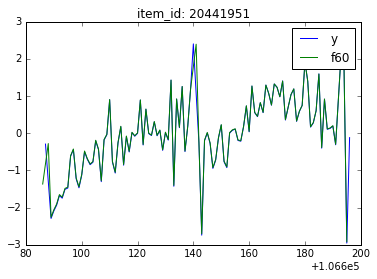

9571.74074074 9405.27429589
6059.03703704 5861.35003872


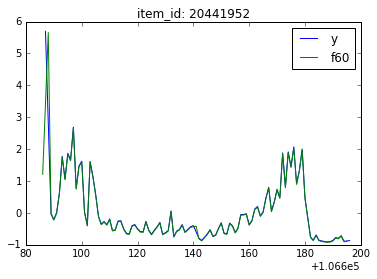

4404.5462963 4369.46572796
2804.68518519 2739.83480391


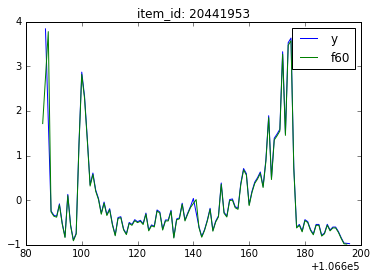

34239.7962963 21010.7881081
21391.7314815 12990.3222643


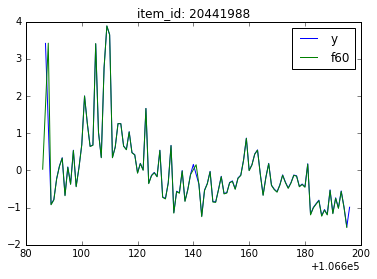

15191.0555556 7632.97627602
9500.96296296 4694.49920598


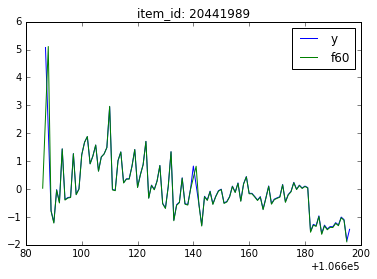

52003.5 34365.3995104
32546.2962963 21239.1359053


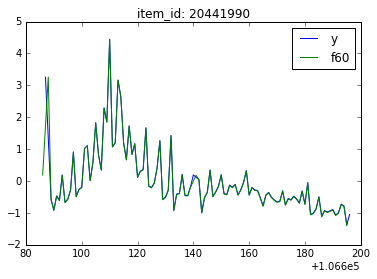

20267.5925926 7373.12690719
12778.7777778 4590.52409324


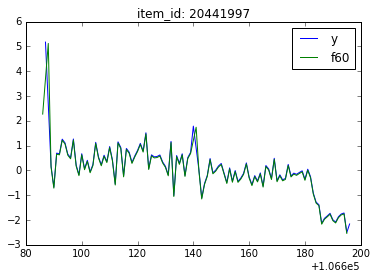

84186.0925926 18309.6334958
52184.5740741 11384.5954093


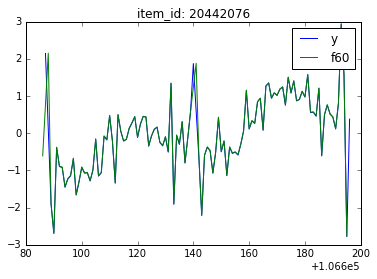

7319.41935484 10097.7535134
4561.0 6262.52065865


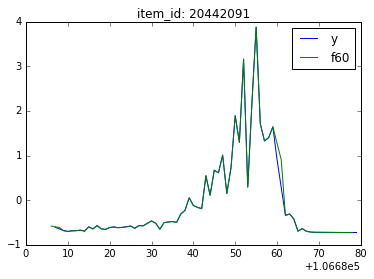

3329.08571429 5023.23188721
2078.22857143 3114.81164838


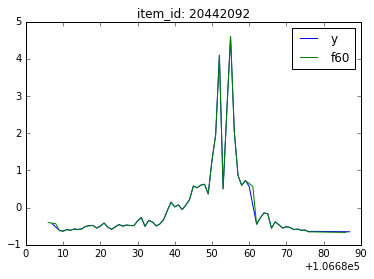

604351.074074 178119.767913
378935.296296 111383.666454


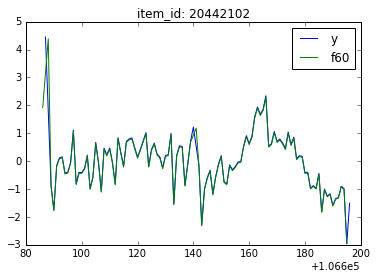

1435431.61111 390576.470571
899164.5 247415.303307


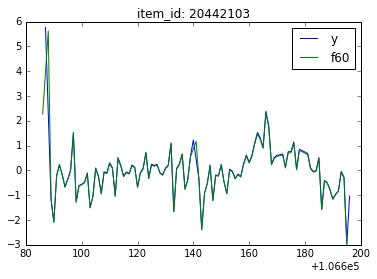

169477.833333 60396.4870228
106422.324074 38121.9231346


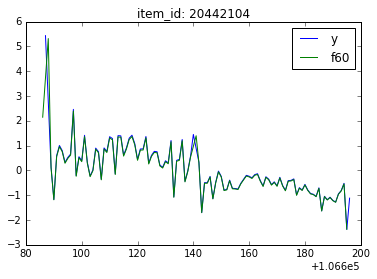

4629.825 3267.238007
2969.55 1982.23290698


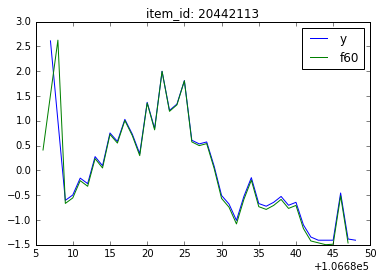

3985.2195122 3213.74745553
2567.95121951 1986.60434583


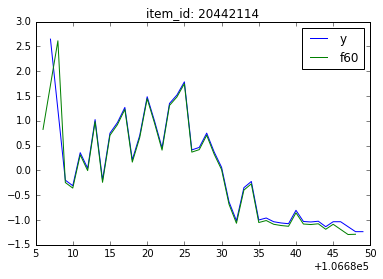

37855.5555556 15478.1359716
23640.9722222 9644.87106979


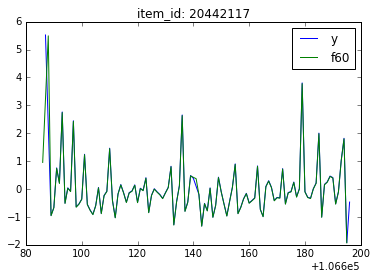

44.4516129032 52.5270060861
23.8709677419 34.4240556696


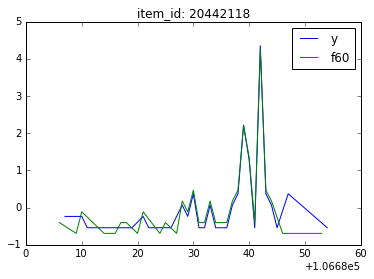

45.9333333333 49.369986384
17.6666666667 28.7150754057


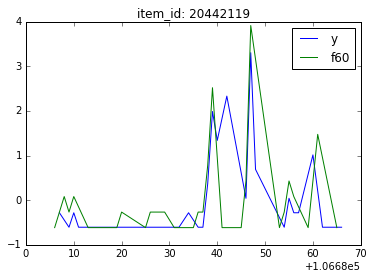

28386.4907407 6980.93496669
17641.6203704 4327.23027428


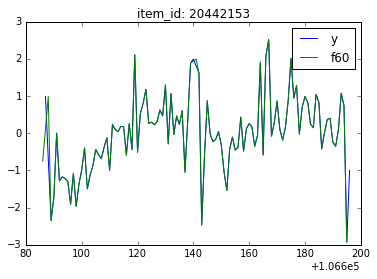

15099.4933333 16226.8072837
9563.09333333 10043.6104799


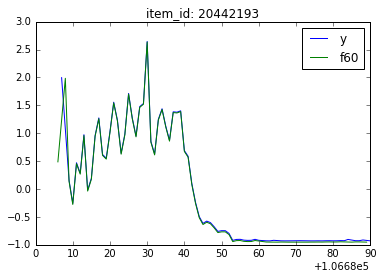

33687.6168224 28840.9802193
21248.3364486 17853.5509879


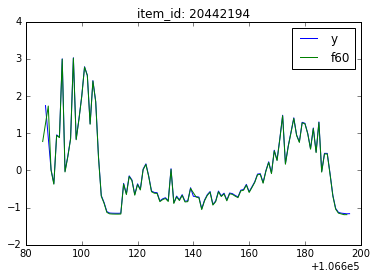

47420.3148148 11439.5355656
29438.25 7106.43292315


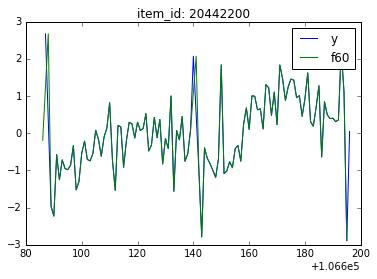

144.0 0.0
0.0 0.0


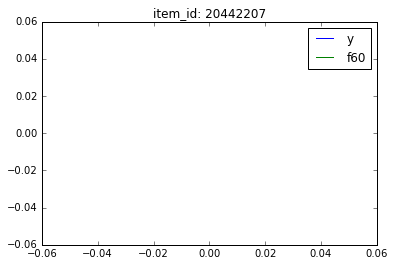

4717.41860465 2530.18644623
2986.68604651 1554.96431771


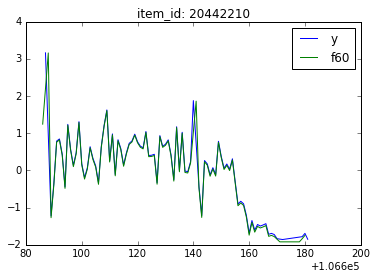

3602.725 2900.03249109
2308.7 1772.1621568


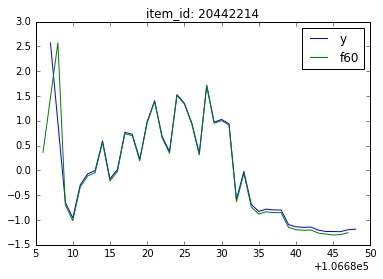

21708.1097561 30933.4573766
13521.6341463 19190.5748039


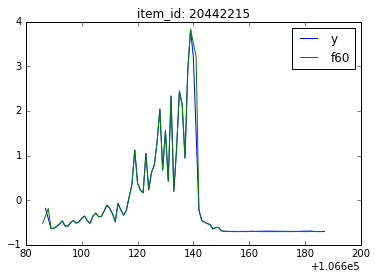

2889.58974359 2604.76643195
1819.0 1606.68388383


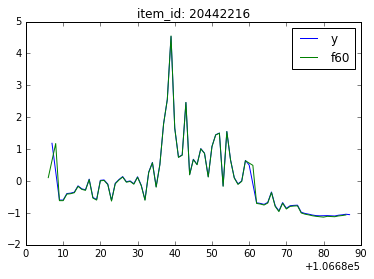

2294.85714286 865.015512424
1477.85714286 521.867232314


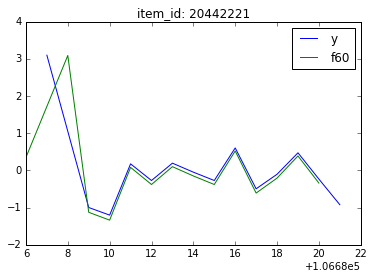

544.055555556 406.655619917
338.851851852 252.003336795


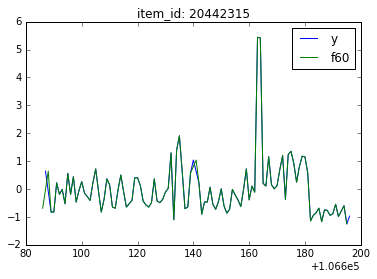

922.981481481 461.777022139
577.481481481 282.961929172


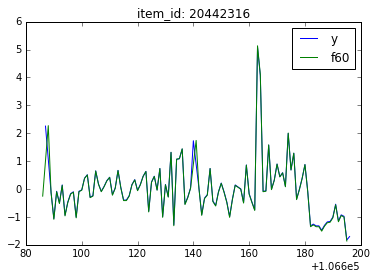

2396448.4537 945065.727391
1480275.68519 591435.164297


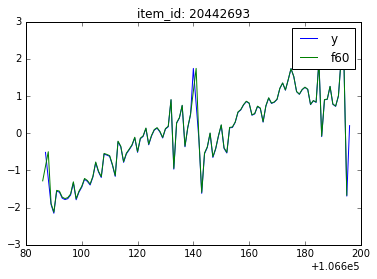

391503.175926 107587.222444
242750.583333 67073.6995259


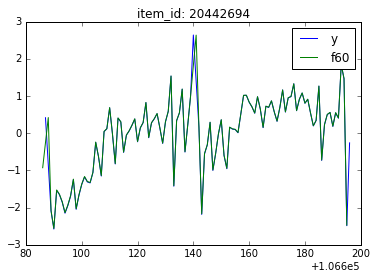

32240.0925926 15503.1497185
20271.6666667 9588.93068518


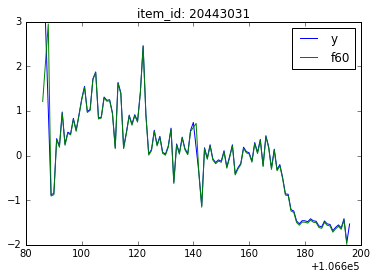

2292279.4537 765728.274314
1439490.69444 480140.233417


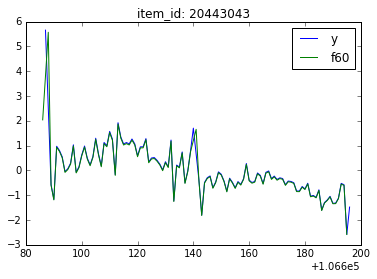

69875.4074074 26058.3991287
44047.8981481 16425.9483102


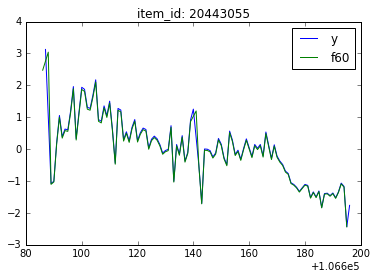

513446.314815 158824.239725
322010.601852 99148.7904457


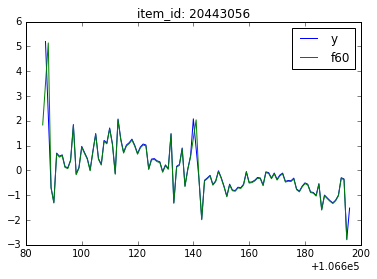

115111.064815 39805.7834578
72426.1388889 25278.0943098


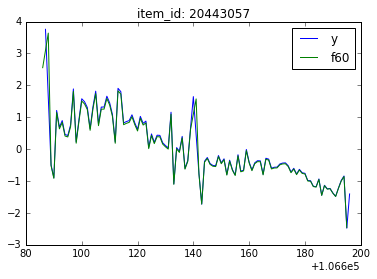

138.142857143 246.597664554
65.7142857143 160.966468811


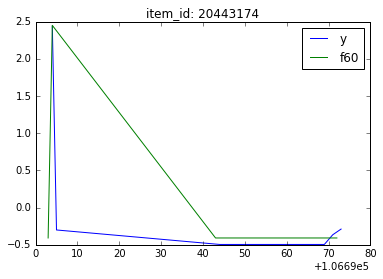

268.333333333 334.508926969
153.333333333 216.846079564


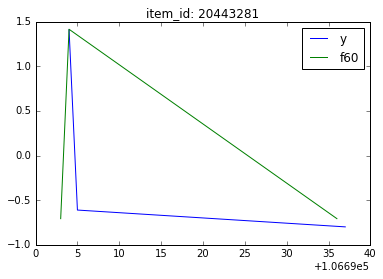

14622.0833333 14974.054244
9145.90740741 9269.681963


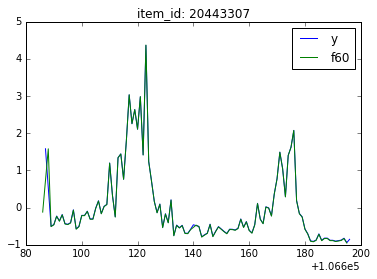

21217.2592593 21998.2379245
13253.7685185 13621.9996531


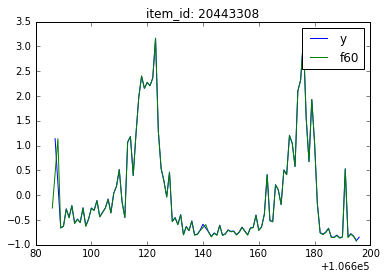

96853.6851852 39071.1396116
59964.2037037 24440.5264998


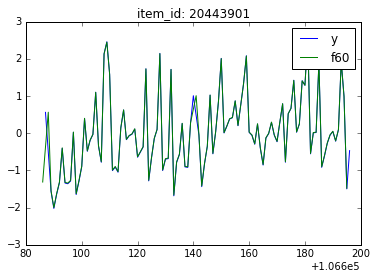

95032.6203704 38052.2060091
58827.5740741 23829.318498


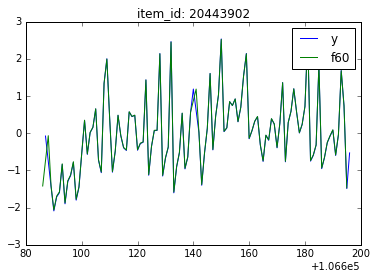

73093.8888889 61407.3408423
44968.75 38298.1918672


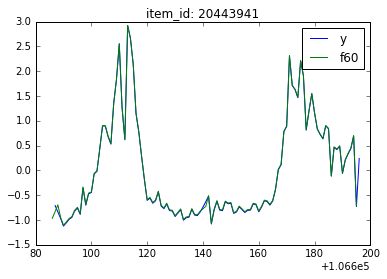

179829.351852 158438.393615
111013.074074 98827.8996077


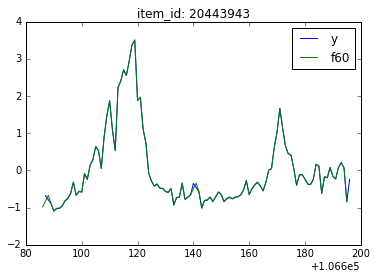

5245.53333333 5245.47801275
3293.22857143 3243.00253662


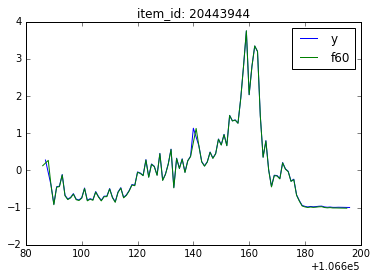

4827.44230769 5005.12027602
3038.23076923 3096.61445164


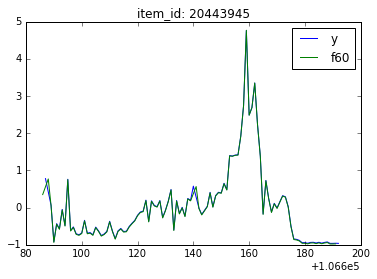

36278.4722222 7829.31079042
22590.0925926 4873.25548755


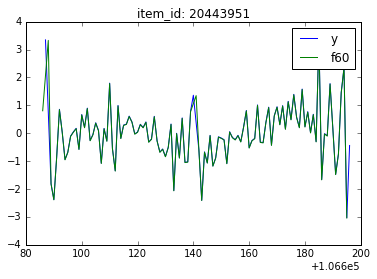

184040.87963 142929.365471
112783.87963 89200.2204589


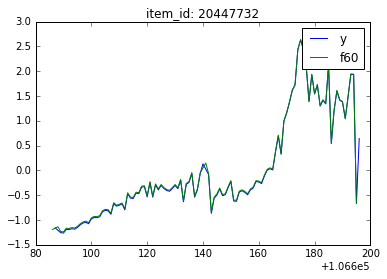

18624.9351852 5986.90443922
11487.5092593 3614.57229808


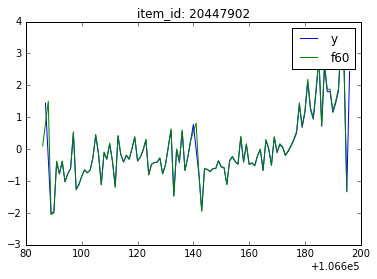

2247.87962963 1104.14645028
1395.28703704 685.412028703


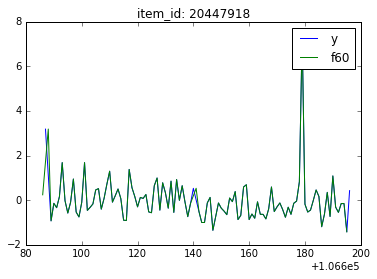

3404.22222222 1500.76897162
2124.74074074 929.820486163


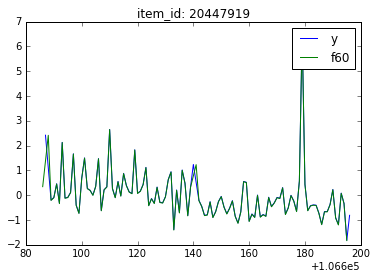

30.3333333333 24.0670360082
1.66666666667 3.7267799625


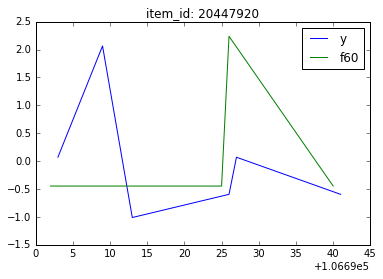

201092.018519 83521.4365077
123776.240741 53237.8752395


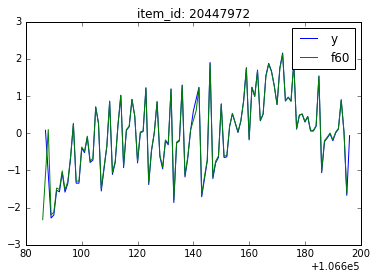

117063.37037 50530.1637476
72140.462963 32132.6227919


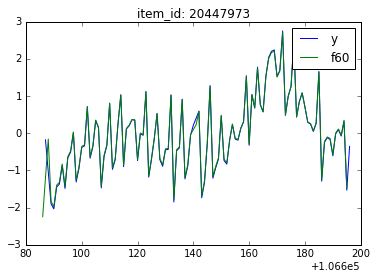

604495.361111 154667.526995
376039.740741 95939.646011


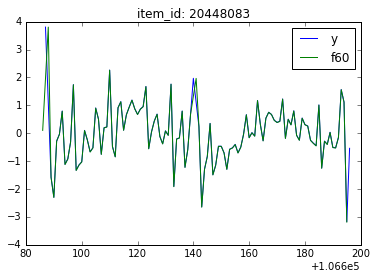

588510.481481 141868.857324
365849.009259 88018.0238183


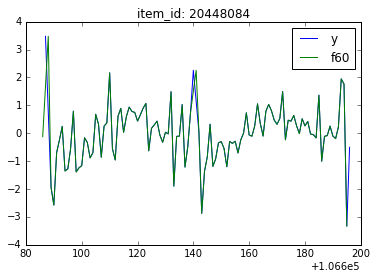

3045.23148148 1096.63848838
1898.61111111 676.541187508


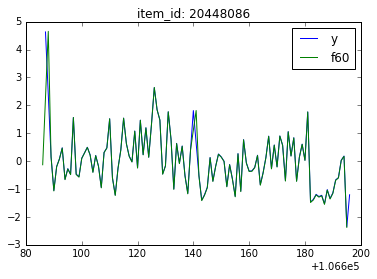

106434.714286 45901.2256862
65344.2571429 29188.2158847


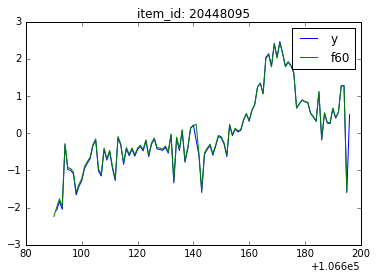

86720.4356436 26493.1903866
53381.3267327 17291.9938975


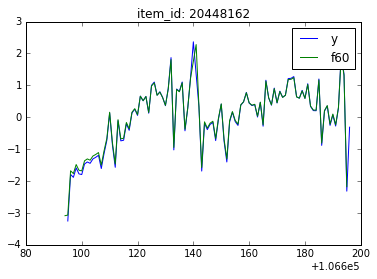

1333.08080808 478.396198525
818.888888889 308.289149623


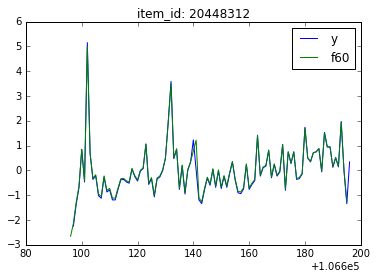

105994.914894 83467.3532469
65834.0425532 51845.0958533


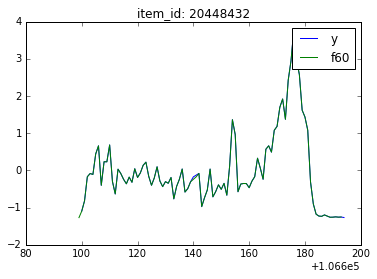

21311.9578947 9481.70514303
13085.4736842 6040.65624501


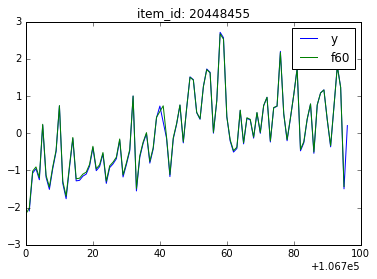

11835.9166667 3223.03348923
7387.46296296 1987.92721207


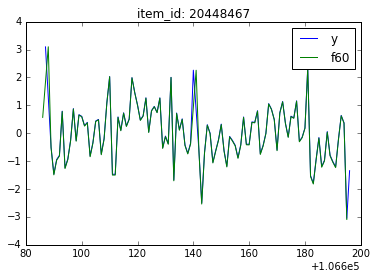

34691.0273973 24667.1215694
21547.1232877 15321.7817367


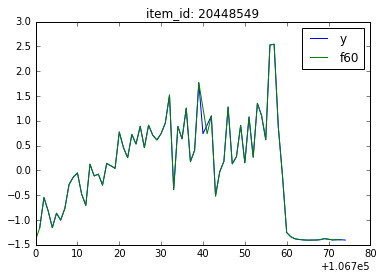

131384.83908 63542.5363057
80547.1494253 40396.0080572


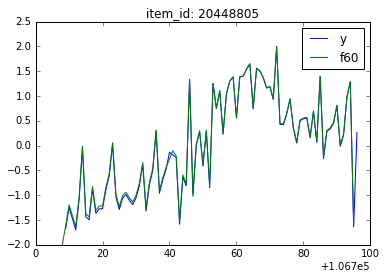

8726.0 6393.57787531
5365.66666667 4013.5716588


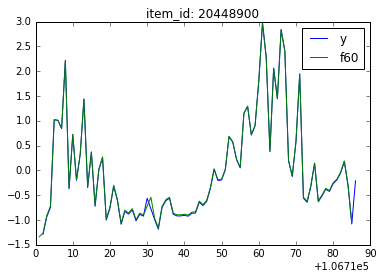

55061.3924051 92076.7514509
34037.4303797 57269.1911498


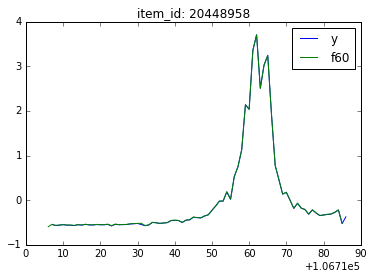

260935.675 266041.270039
161147.775 165938.789568


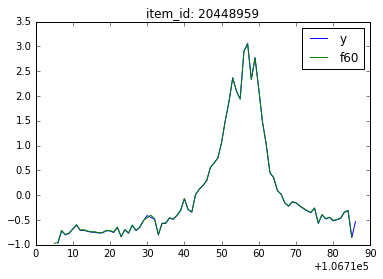

8836.27777778 2131.42012228
5525.80555556 1365.76259703


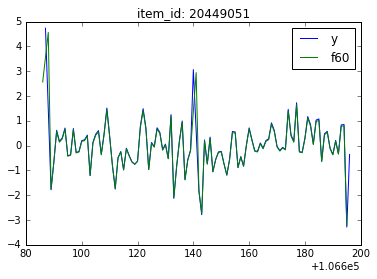

46257.8684211 23180.0897694
28154.2105263 14655.7455496


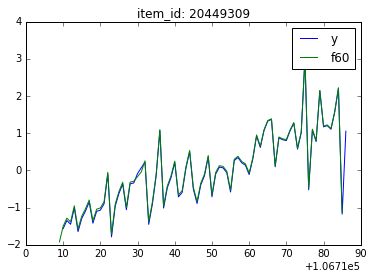

111135.37963 43280.9973106
69179.3981481 26833.0472655


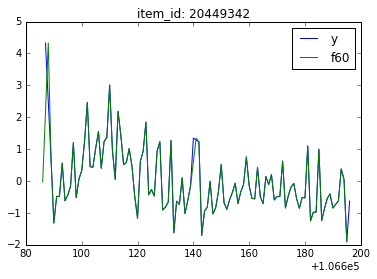

49722.75 20632.5983715
30997.0740741 12821.3151762


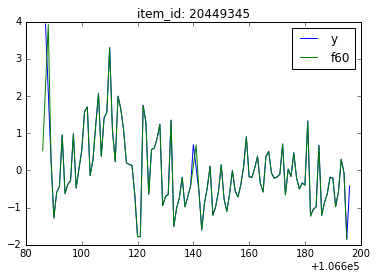

10880.2037037 4507.8370414
6783.05555556 2791.29449205


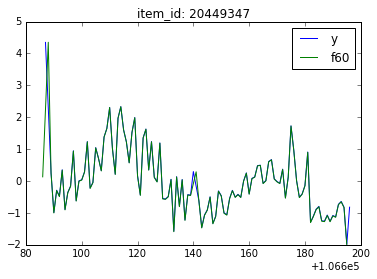

99106.1866667 48993.5119013
60852.6 31225.6823323


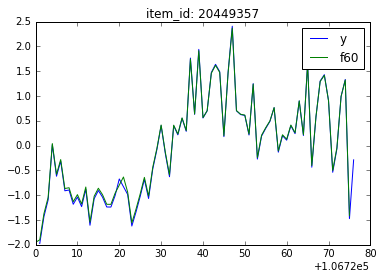

101214.746667 52223.4422943
62011.4266667 33227.9744513


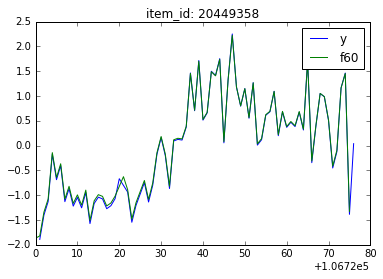

152570.731343 65143.1904783
93024.9402985 41964.9196869


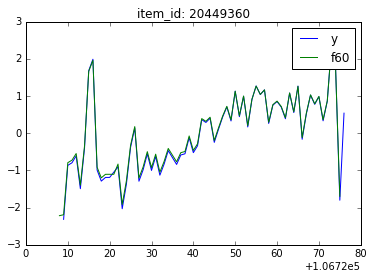

17858.6203704 6928.30571683
11156.3888889 4281.34708775


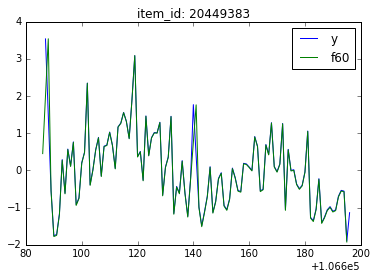

215.188679245 218.172949969
130.566037736 136.59491267


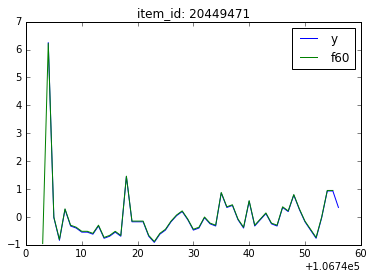

2481.93846154 1487.84268065
1519.13846154 943.365218075


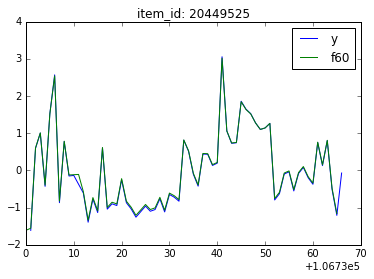

3351.53846154 1898.46102107
1830.15384615 1245.46900935


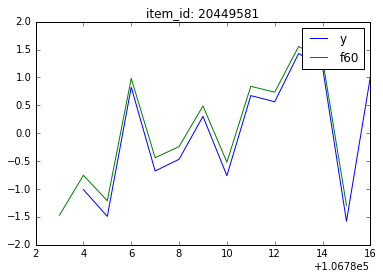

16759.4285714 7647.28967179
10261.5555556 4923.54420923


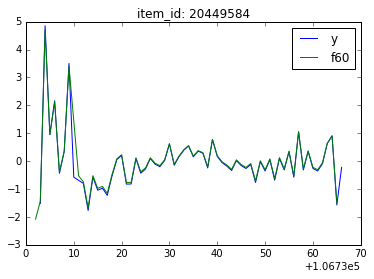

20910.9032258 13688.2799371
12534.7096774 8802.51713704


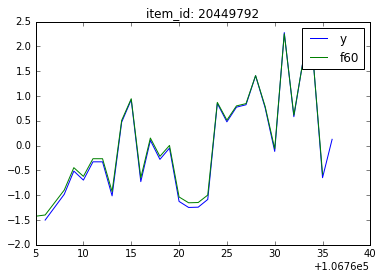

2003.07692308 1077.70064786
1151.0 747.281123088


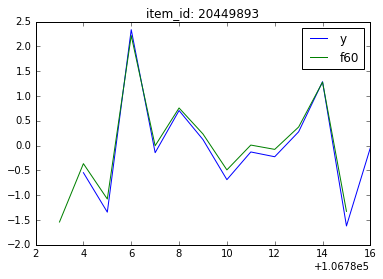

986.351851852 499.551879092
615.638888889 308.009242837


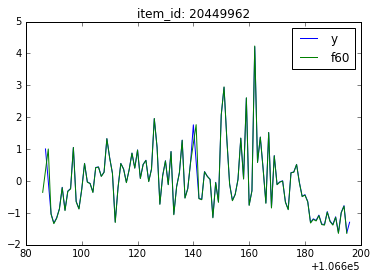

17440.8139535 7098.28075895
10549.8139535 4695.21269427


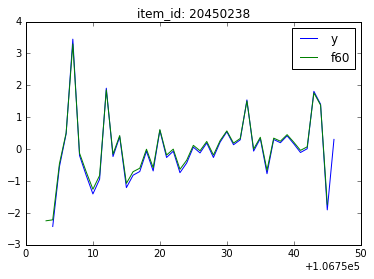

4145.97058824 4296.1492093
2438.47058824 2700.33567886


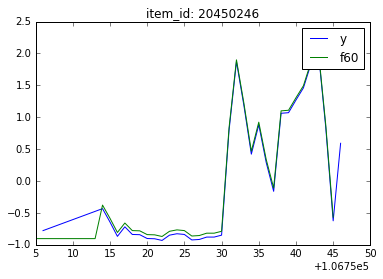

3489.52941176 3561.66180839
2058.82352941 2246.15130273


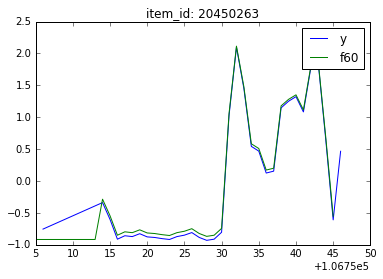

63898.2926829 22265.5196006
38519.5121951 15054.8814563


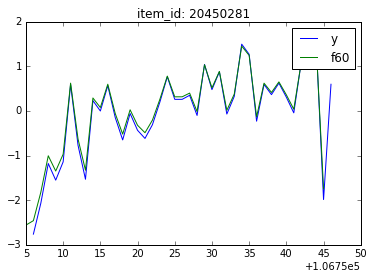

300557.846154 118294.97876
182537.179487 79113.5238162


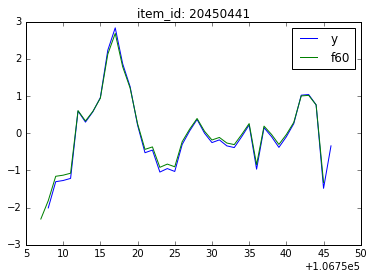

39595.6944444 16678.6067311
24147.6666667 11040.8199223


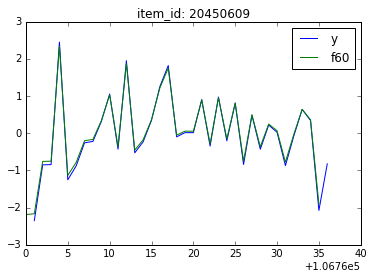

788904.564815 420661.906595
484667.314815 263502.091137


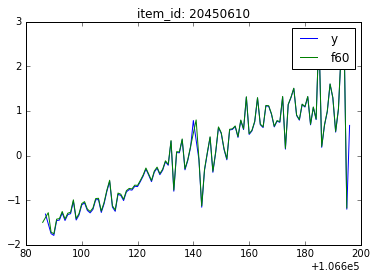

263416.87037 111623.857572
162437.601852 70354.9653437


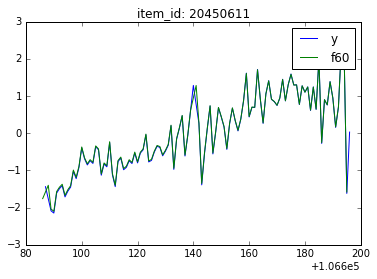

41753.7777778 22255.7793432
25194.7037037 14633.3196629


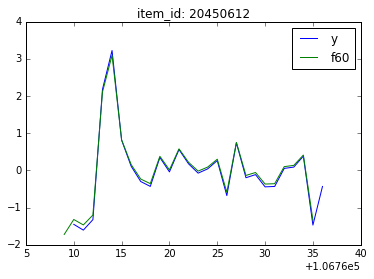

212138.083333 44946.2958469
132022.824074 27968.7931693


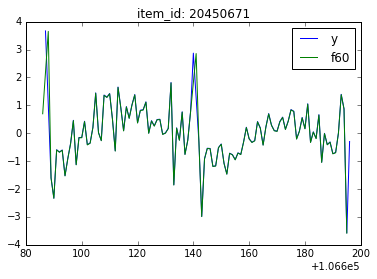

828.523809524 484.774235038
493.476190476 320.4093541


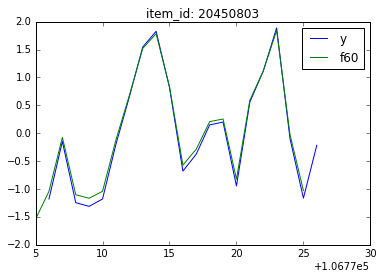

174918.435185 69450.8008677
109027.231481 43312.2138483


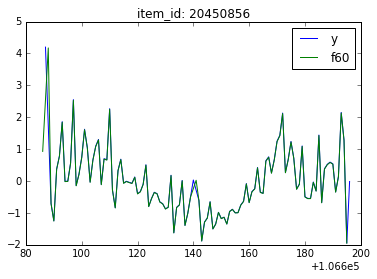

463131.981481 157233.990611
289544.287037 97974.6866983


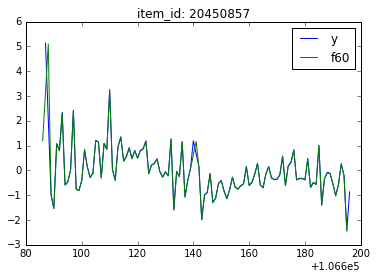

23938.0185185 7955.94162663
15028.6944444 5069.111445


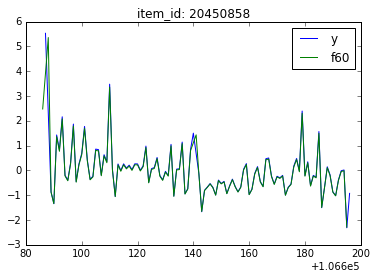

567.461538462 469.425445114
327.307692308 292.45062295


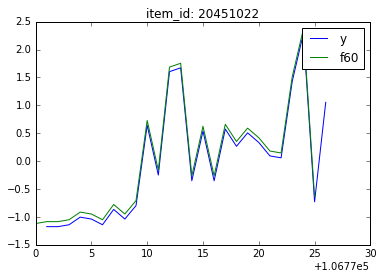

35597.2083333 14095.4112391
21046.0833333 9767.09251738


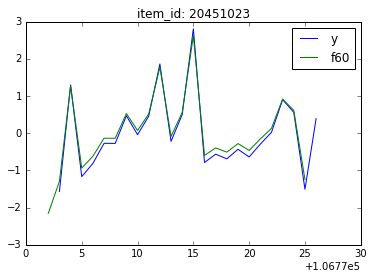

2089.875 1126.66300465
1242.5 746.130294698


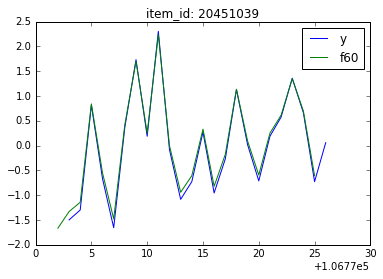

1524.17391304 1056.76267963
911.739130435 683.937781139


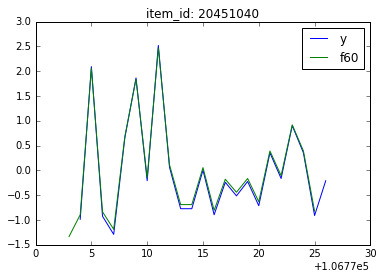

15323.3 5307.53058493
8953.4 3862.87664054


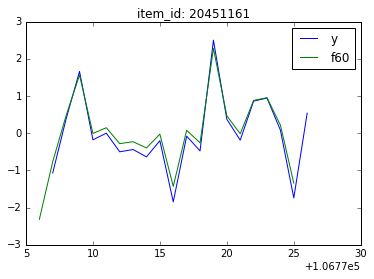

84343.3684211 63188.8071178
47528.2631579 39714.8660153


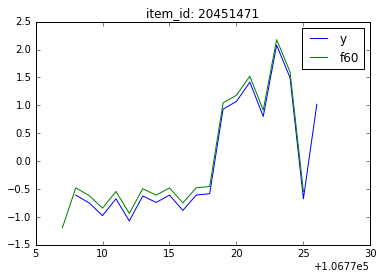

37333.9074074 16311.7826061
23501.7685185 10042.3943301


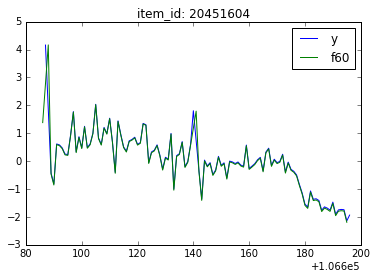

119326.461538 72565.3816951
68926.1538462 49230.7792198


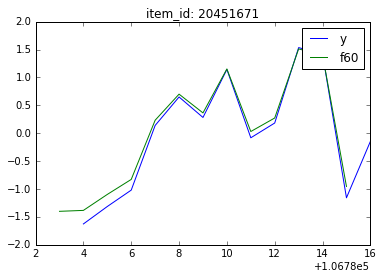

4611.5 5930.68022377
1797.91666667 2211.0361997


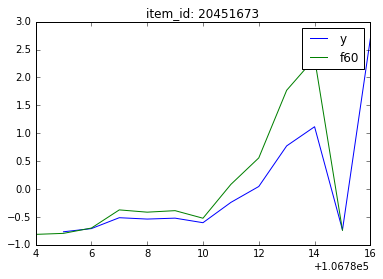

8059.81818182 5051.34145672
4740.81818182 3414.1331608


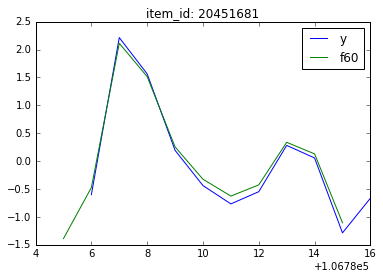

223541.157407 47573.8190759
139298.592593 29690.0454689


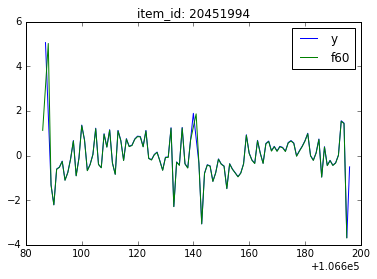

17405.2368421 12326.1151667
10682.9210526 7753.71531787


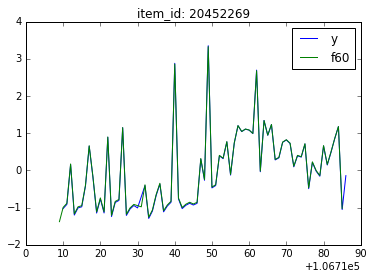

40415.5921053 22549.6121452
24678.5394737 14268.945293


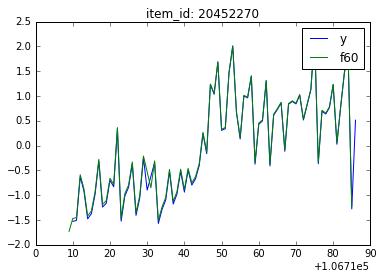

183818.768519 41613.8861307
114680.092593 25646.2953853


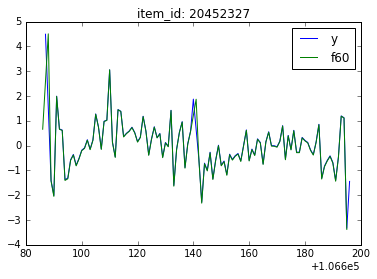

177083.5 41935.0277849
110534.898148 25883.8418219


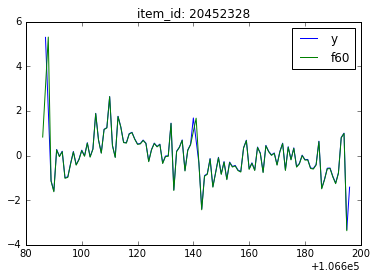

89786.0 47727.6580318
55189.2037037 30111.6426138


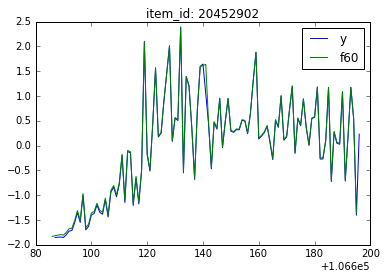

2893.47222222 1187.66222641
1806.38888889 730.290122883


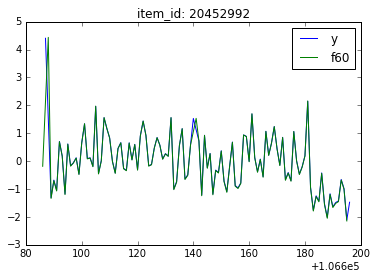

20472.5648148 4856.68641663
12766.1481481 3037.6432166


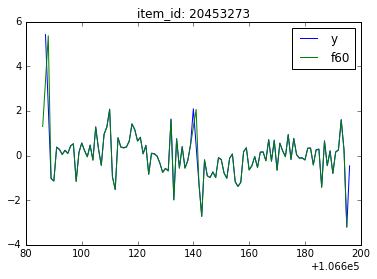

14600.0925926 3369.12179055
9086.00925926 2110.65870662


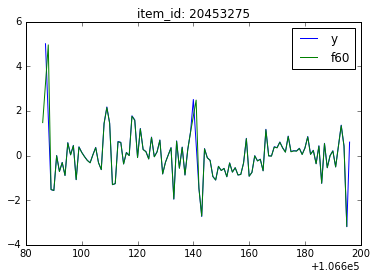

195811.351852 112205.60345
122356.611111 69275.5784757


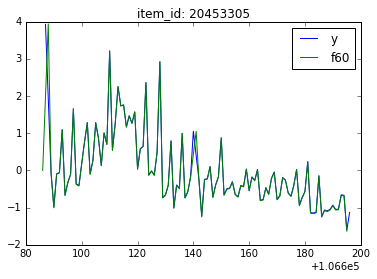

17634.8518519 8996.00323787
11067.5740741 5596.06880898


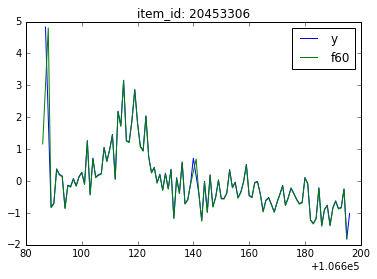

54474.7685185 31555.742106
33585.5 19853.1204509


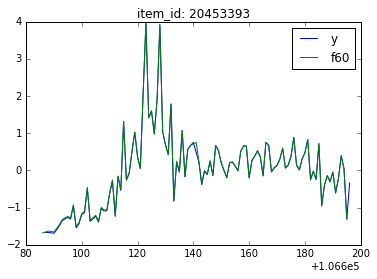

141779.305556 54418.3845984
88414.3518519 33505.6627039


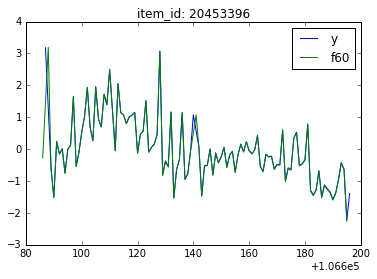

319390.259259 149092.589104
199552.333333 91968.2325712


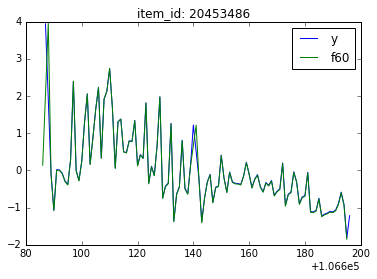

228110.407407 90226.0892524
142284.481481 55708.8235064


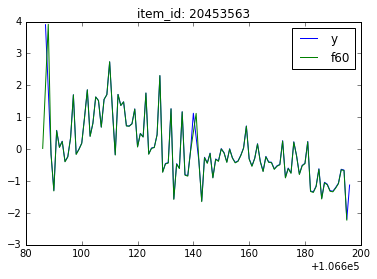

In [55]:
plt.figure(figsize=(15, 10))
for _id in np.unique(train['item_id']):
    print_cluster_field(train, _id, field='y', norm=True)
    print_cluster_field(train, _id, field='f60', norm=True, offset=1)
    plt.figure(figsize=(15, 10))
    plt.title('item_id: ' + str(_id))
    plt.legend()
    plt.show()

162487.896226 38193.8804386
102518.433962 24778.1783179


C:\Users\Andrey\Anaconda3\lib\site-packages\ipykernel\__main__.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


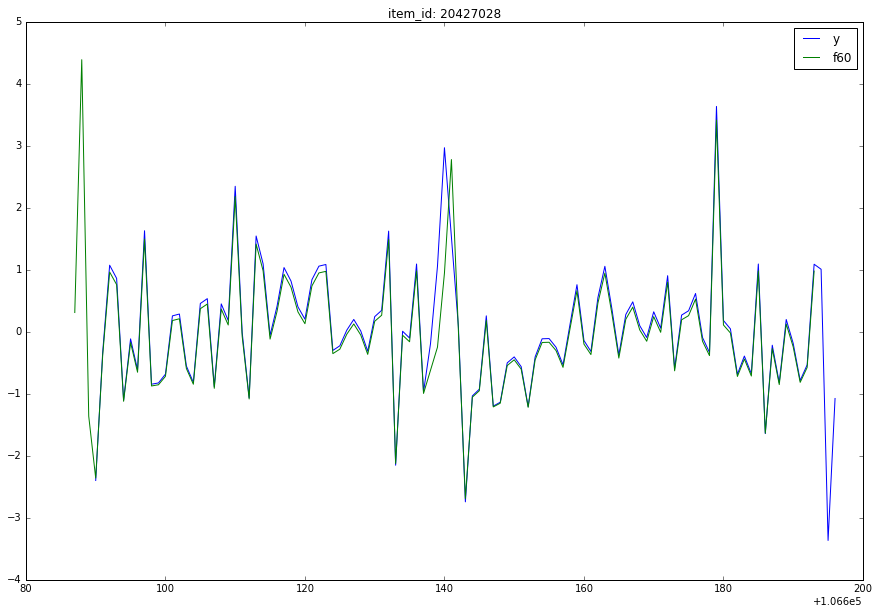

3930.77358491 2680.38084552
2445.50943396 1658.86504873


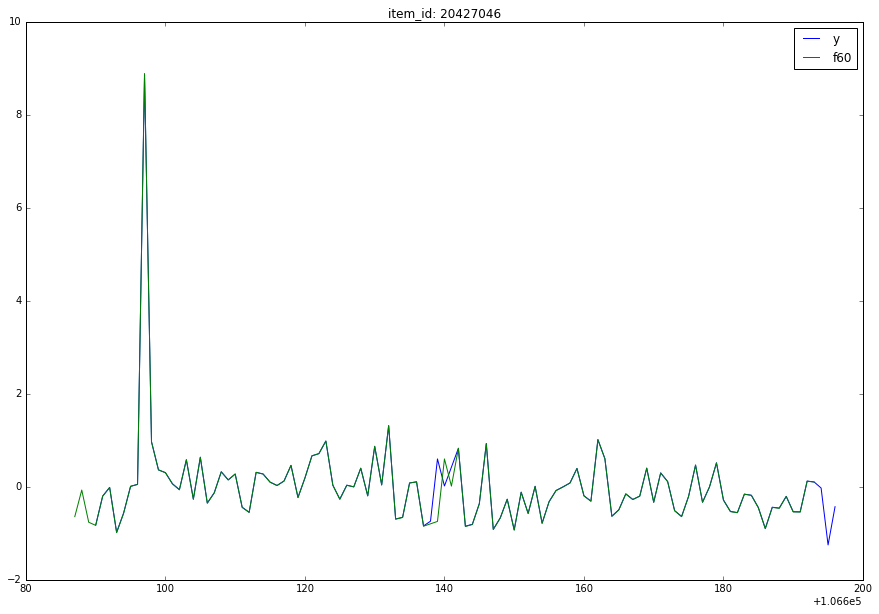

269.133333333 637.608329794
179.666666667 435.845793321


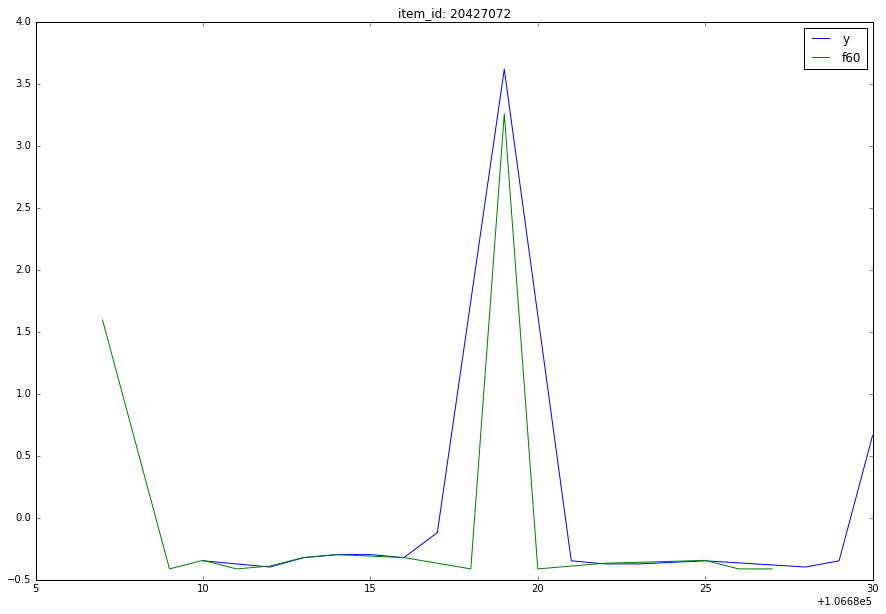

543.857142857 364.35645625
351.238095238 246.517439693


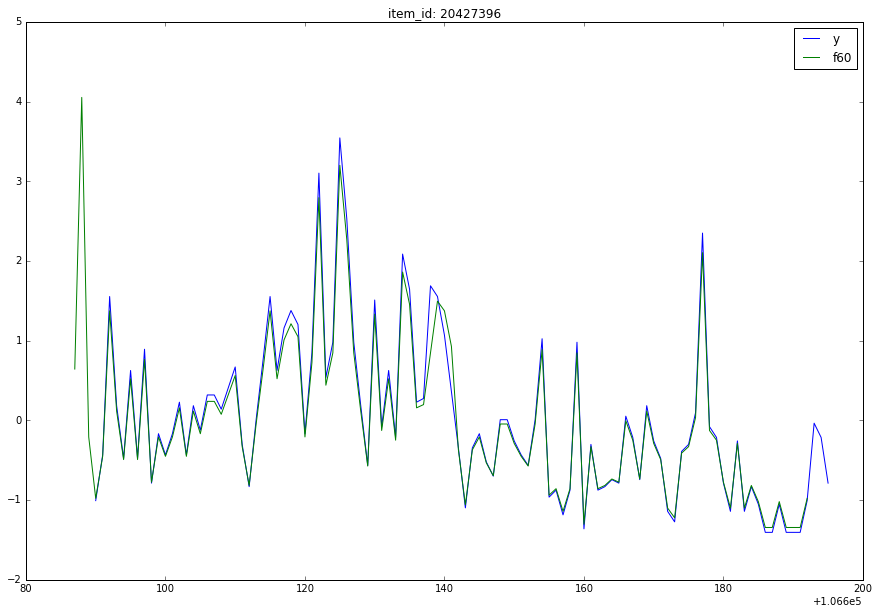

18.6666666667 6.95381589888
2.0 5.41602560309


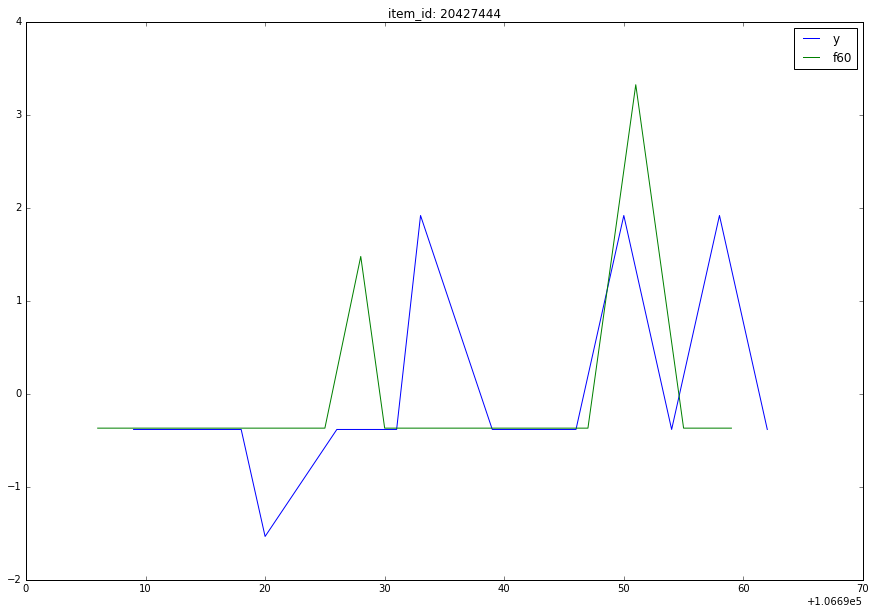

95877.0471698 21798.8689785
59545.8867925 13581.2317156


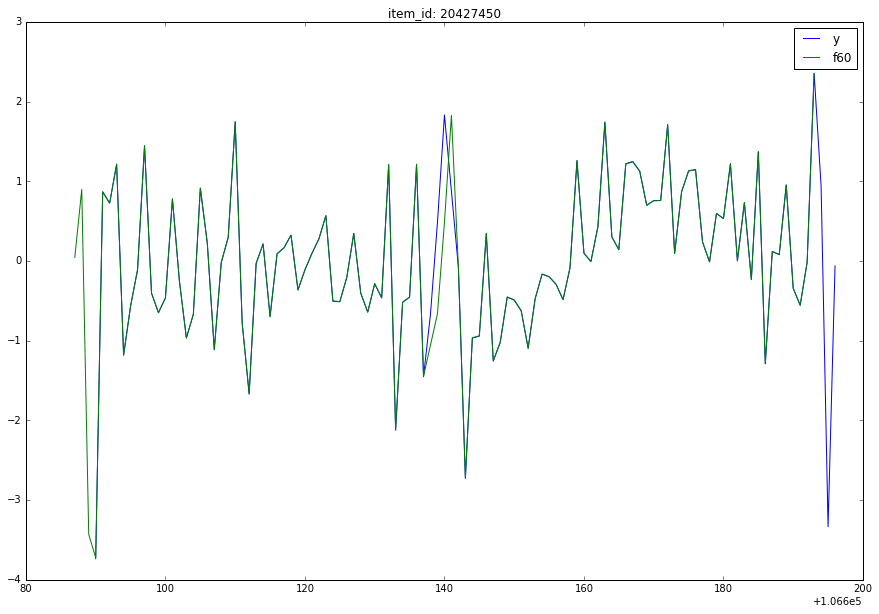

13524.4150943 3474.4502127
8471.10377358 2166.8750603


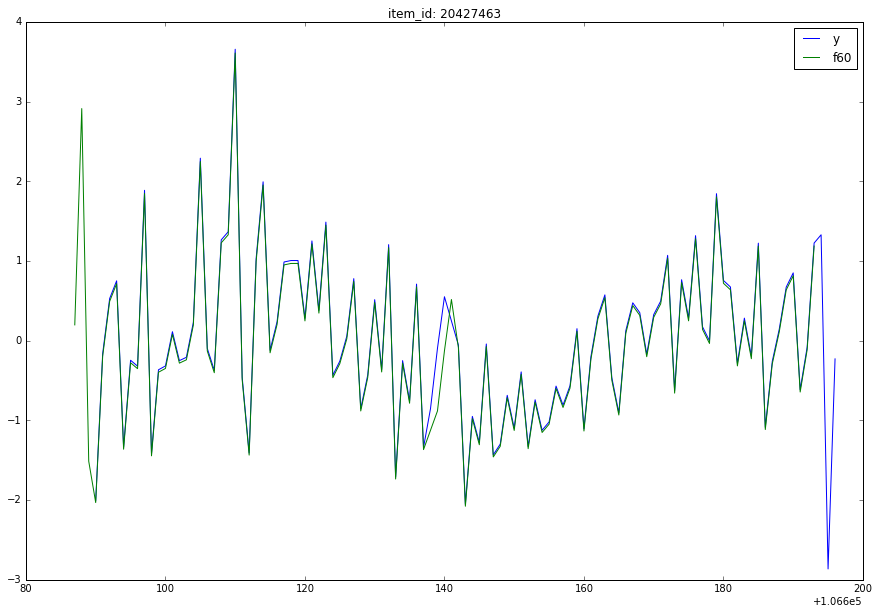

1476.28301887 517.814579525
924.716981132 339.46886246


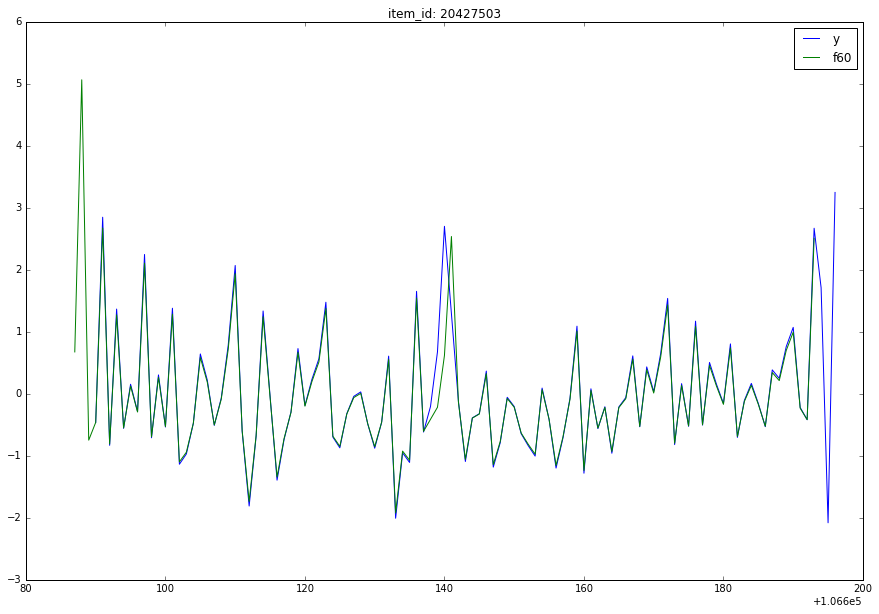

950.933962264 382.263622087
596.122641509 244.853814795


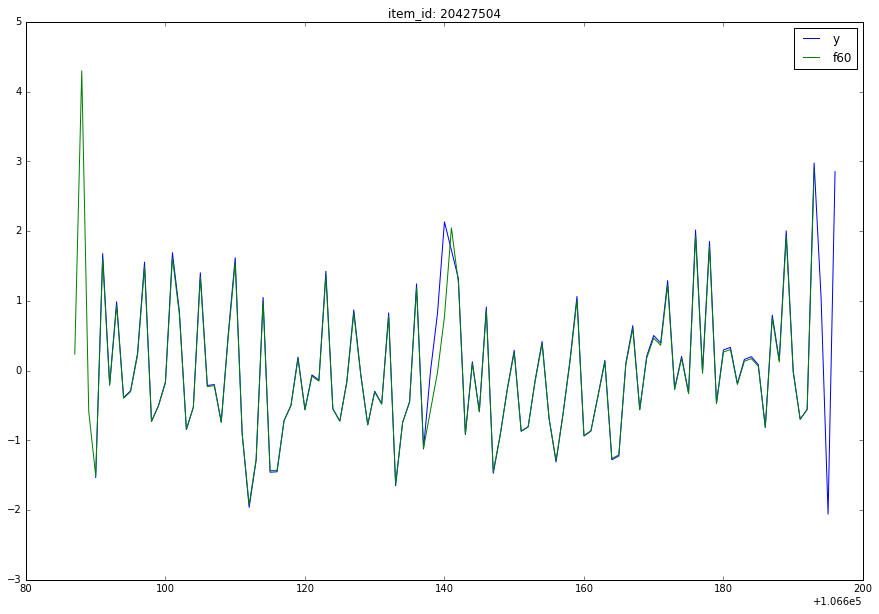

200143.688679 42046.0587805
126653.792453 27142.8297772


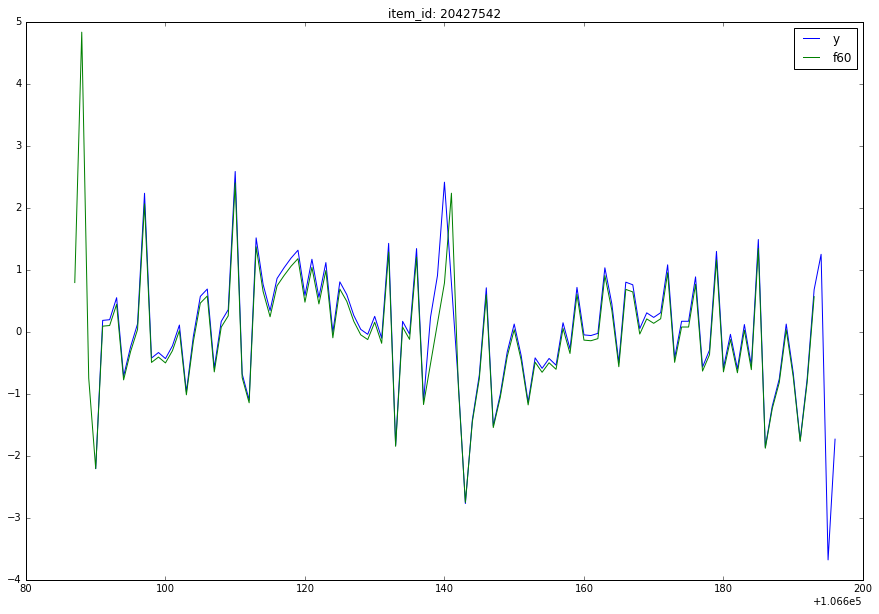

1259882.51887 368858.250888
804372.95283 252147.860439


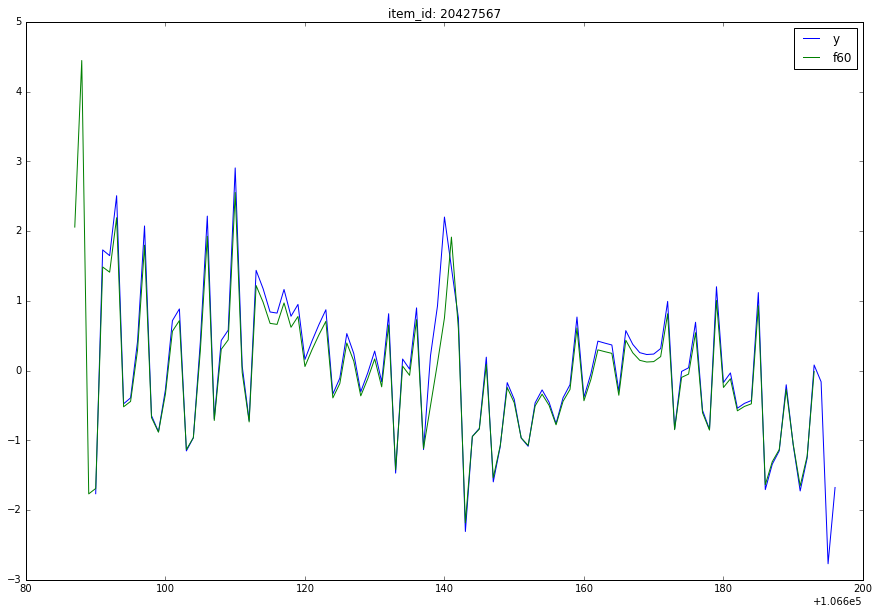

141883.698113 42000.5056187
90374.3962264 28411.2026353


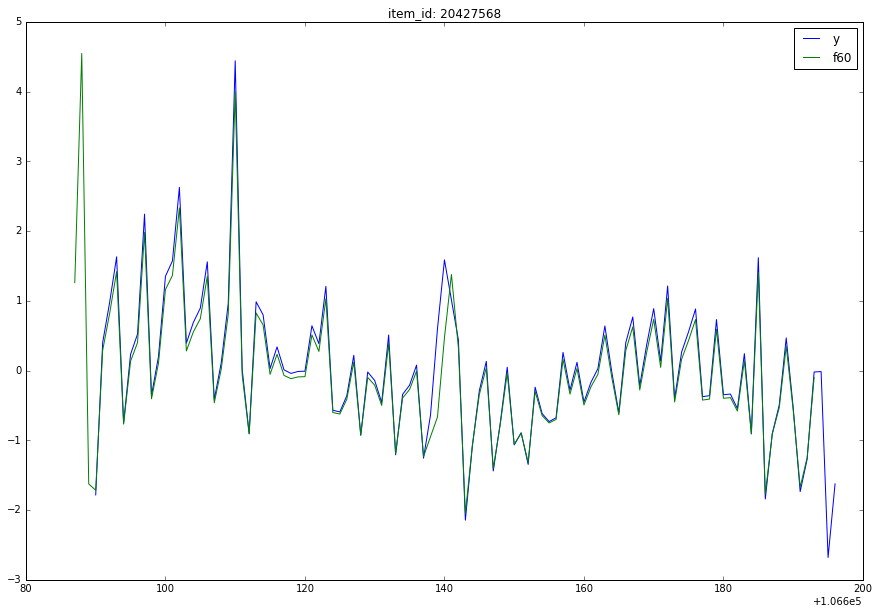

3562.03773585 1199.9193599
2242.20754717 762.567271601


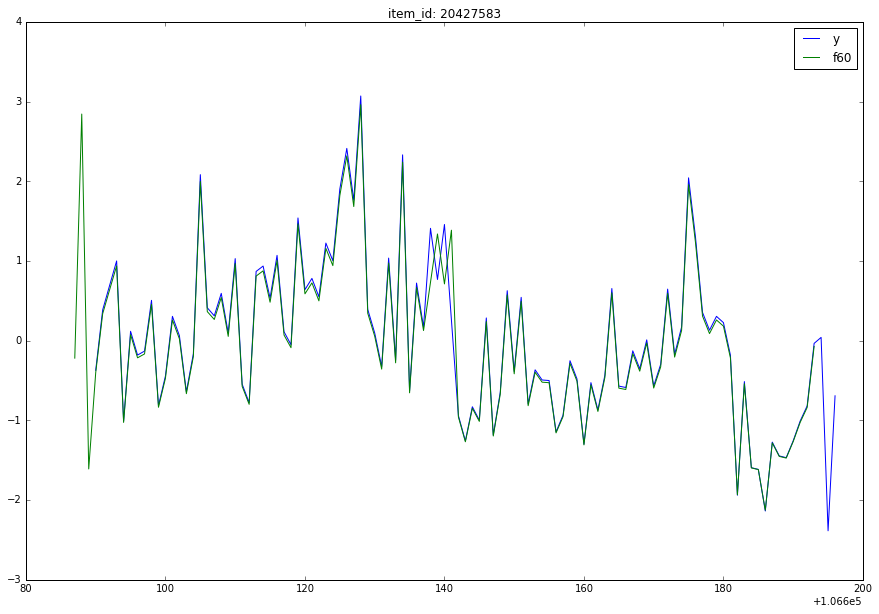

52908.7735849 48793.0050479
35887.7641509 33413.1329314


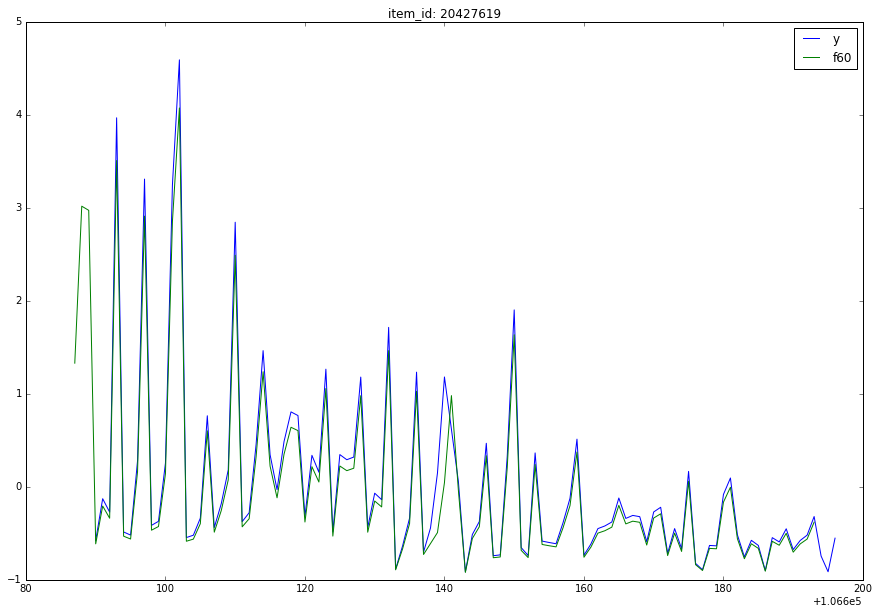

99.0 97.5260648921
1.66666666667 3.7267799625


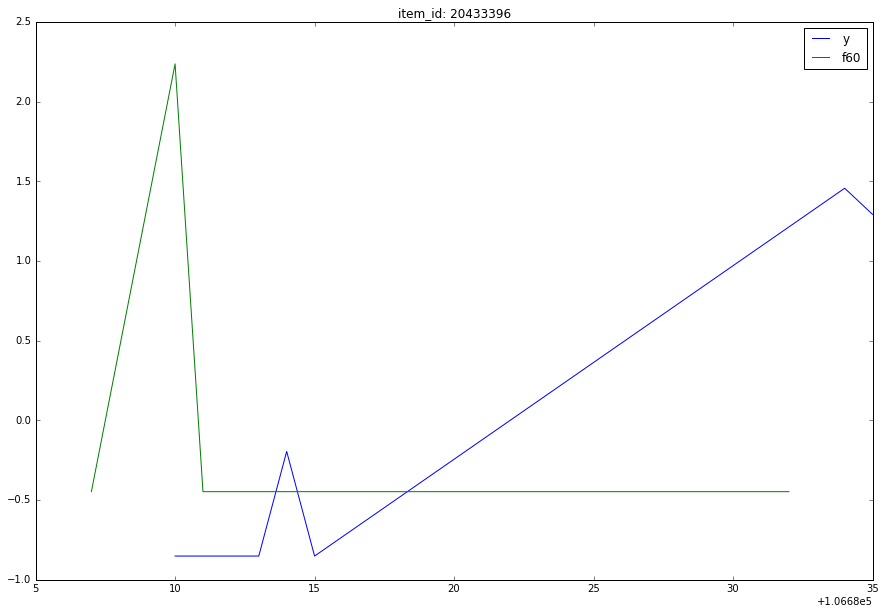

463.028301887 270.509597972
307.5 200.576115981


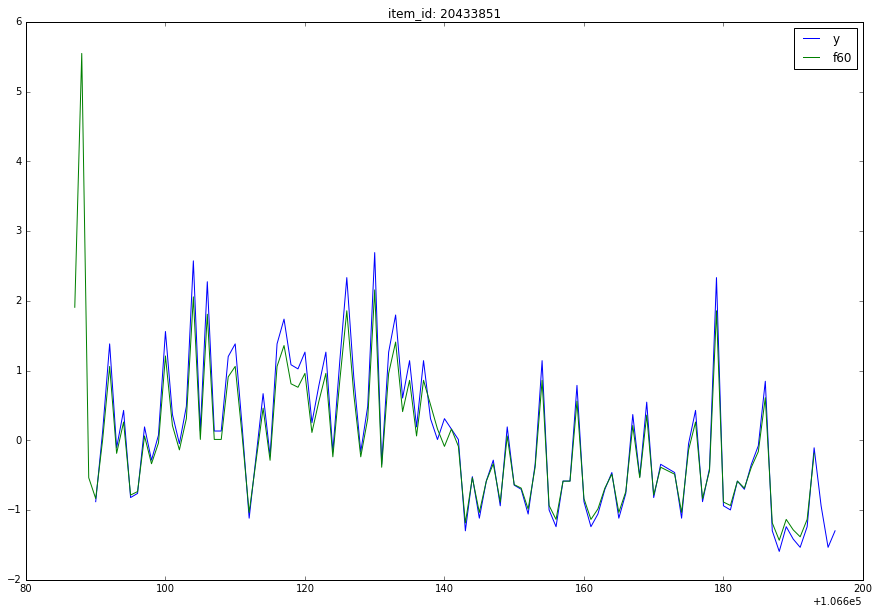

460.657142857 310.009241907
297.904761905 205.96668819


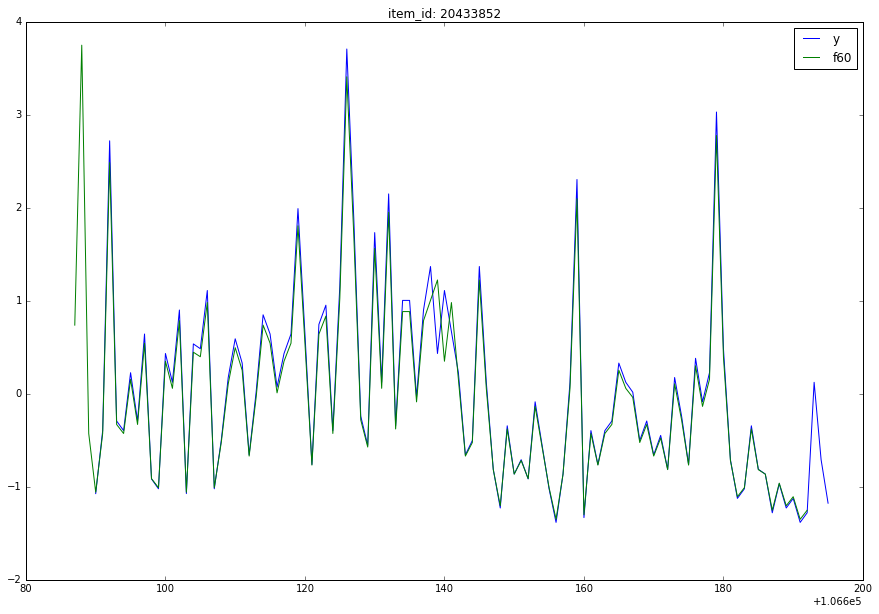

131454.679245 34429.2925065
83318.1886792 22477.2585967


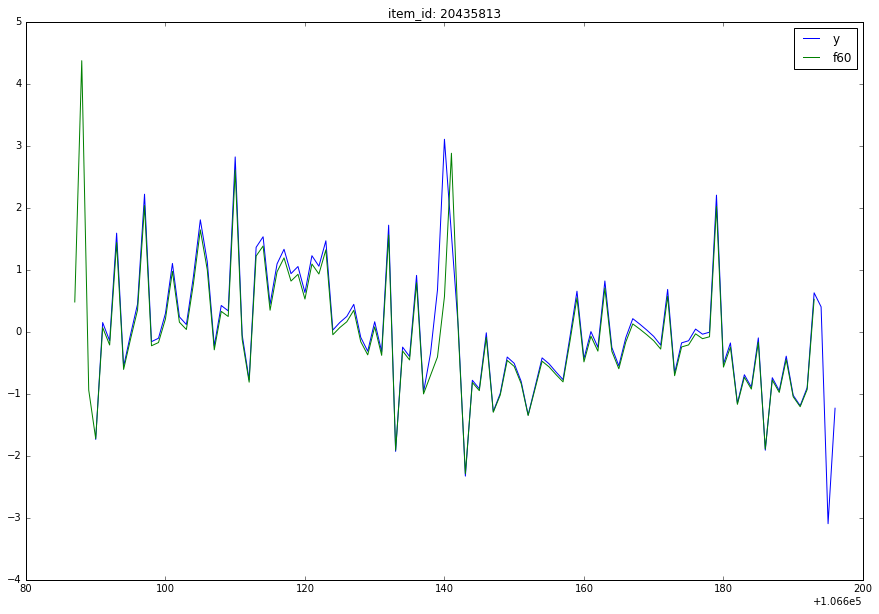

236481.603774 55739.7049382
149423.311321 35176.028667


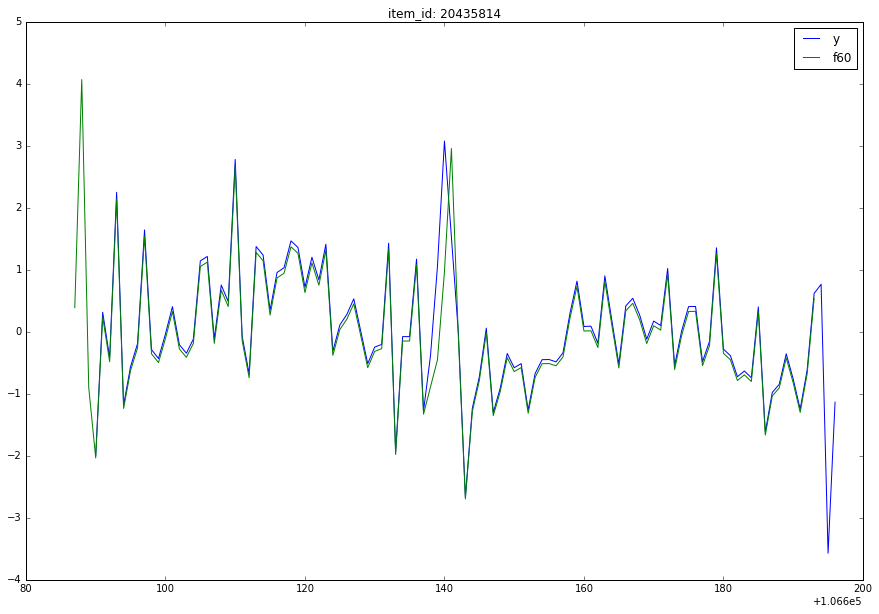

150924.339623 32598.9109932
94863.2641509 20112.7850184


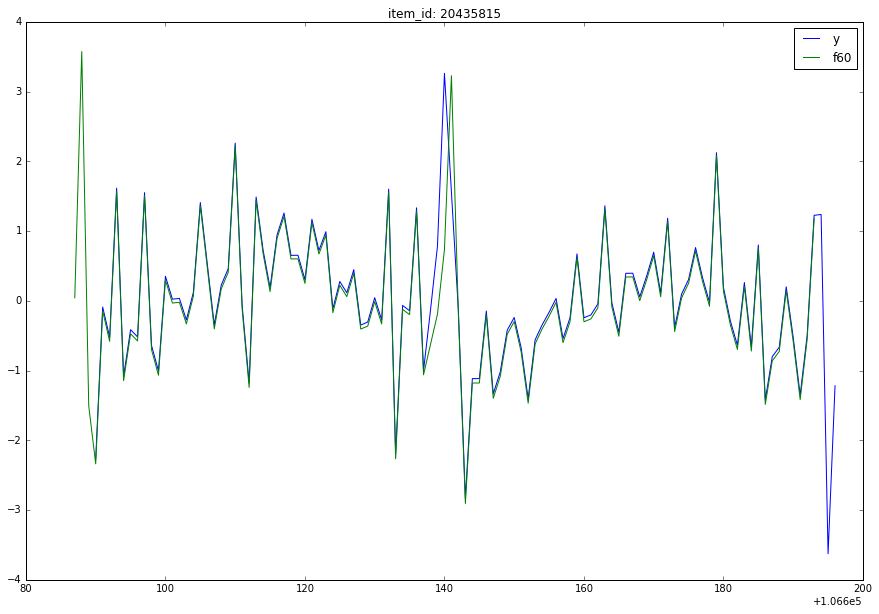

324301.867925 73216.3354139
202221.358491 44409.8434002


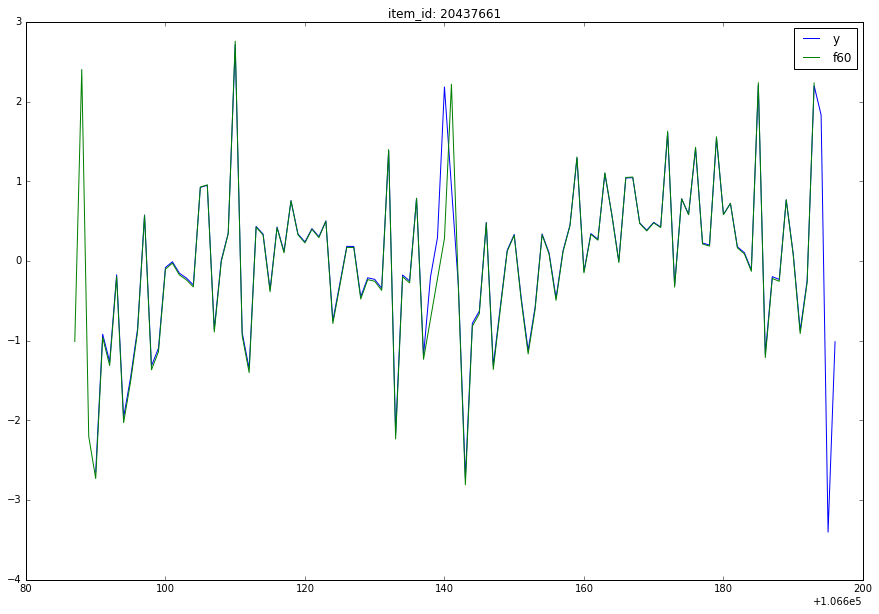

414894.632075 91985.279227
258558.245283 55706.6407888


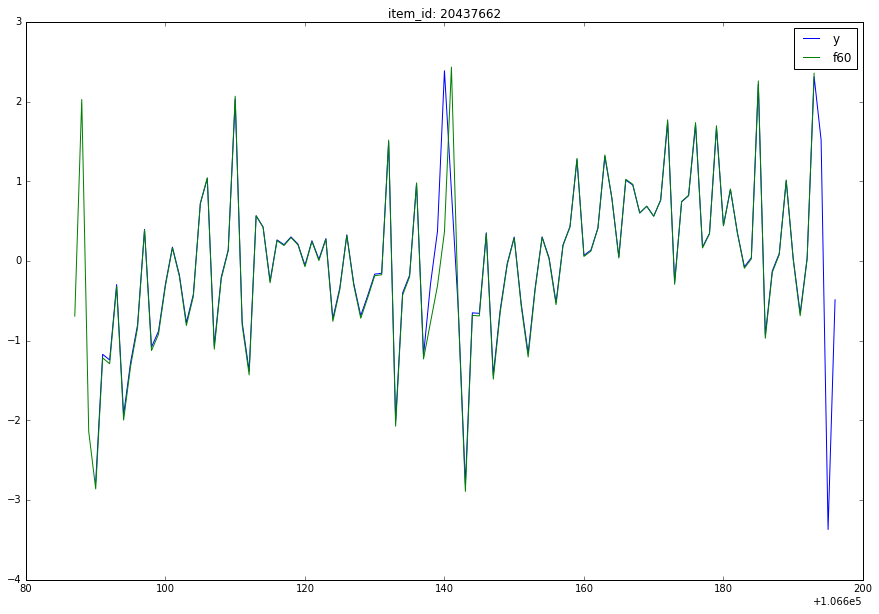

29391.7830189 12084.148566
18824.2924528 7714.02945016


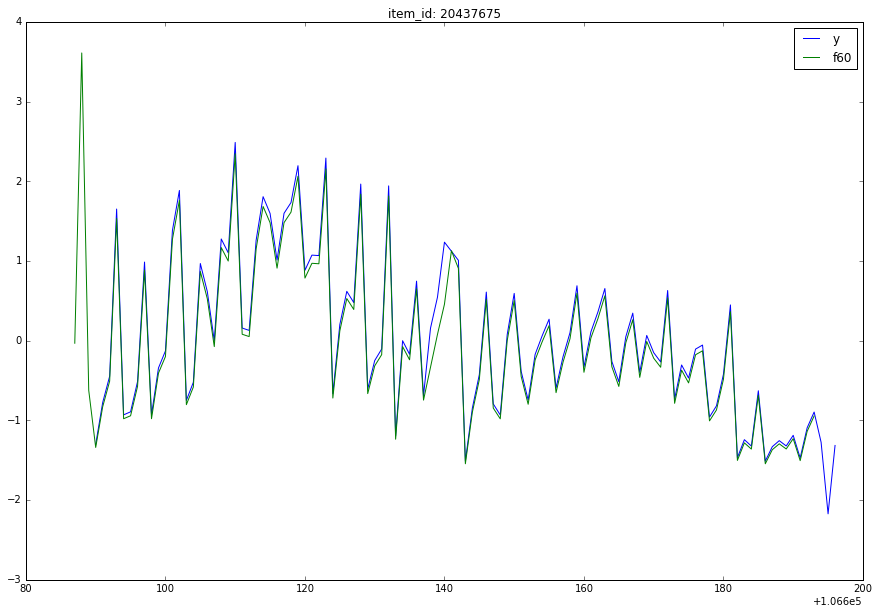

17257.1132075 6295.47968607
10984.1415094 3883.2990532


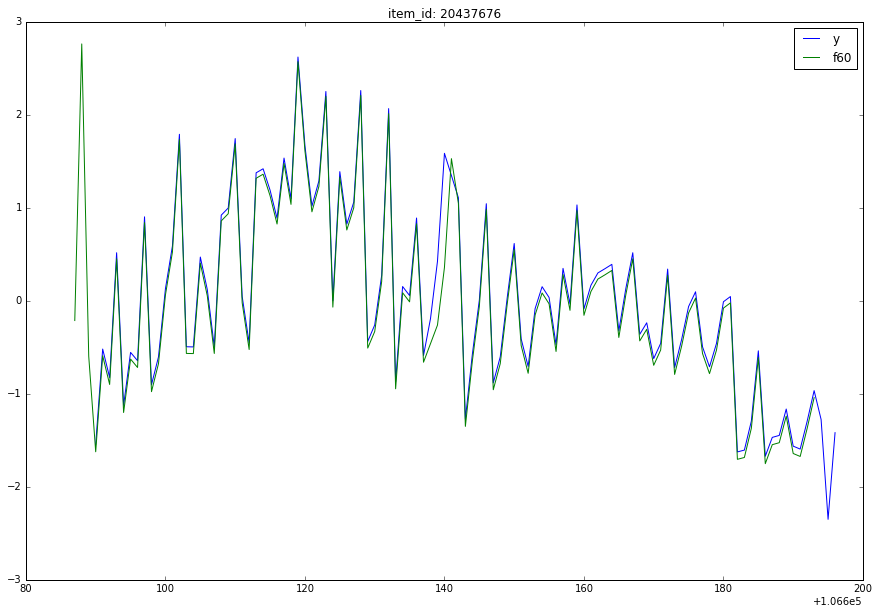

16.0 0.0
0.0 0.0


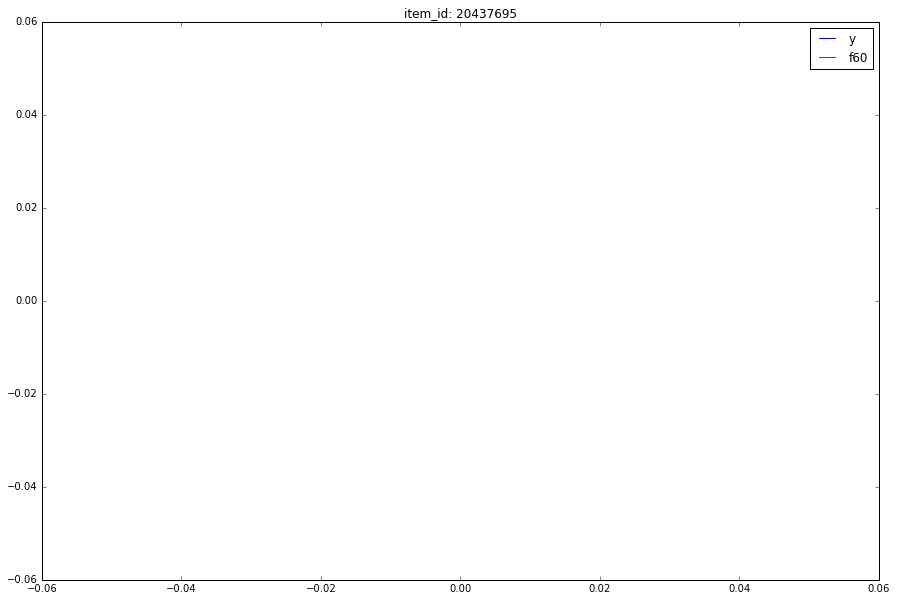

58804.0188679 35191.8124866
38652.3396226 24772.8717506


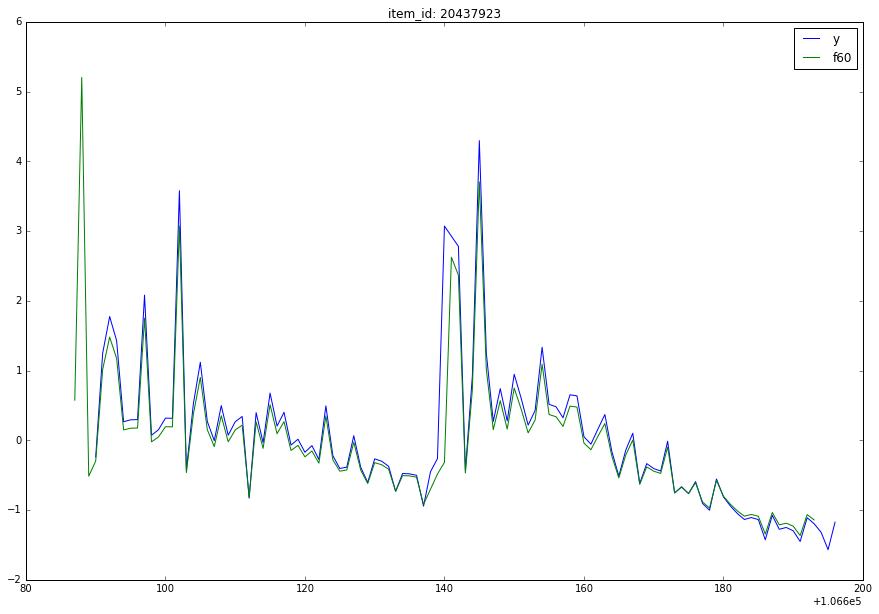

6890.05660377 4461.88214544
4509.88679245 2889.73052971


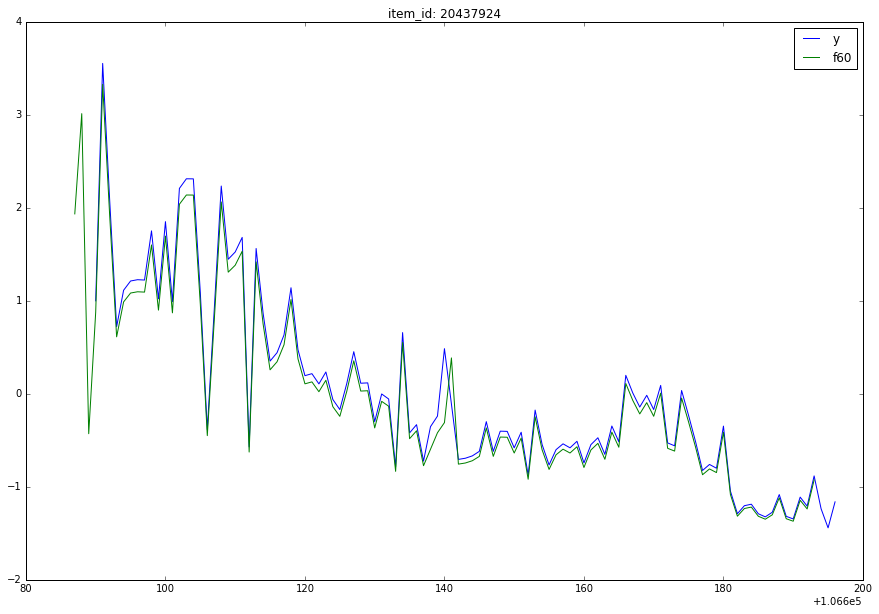

11633.6320755 7789.89197048
7772.5 5757.02138205


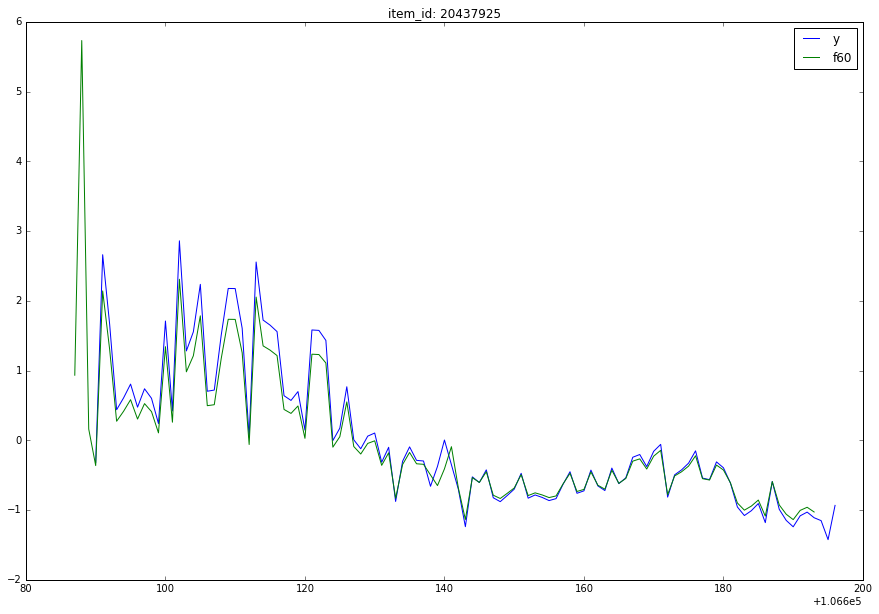

7600.93333333 6530.30982896
6015.63333333 4936.94747446


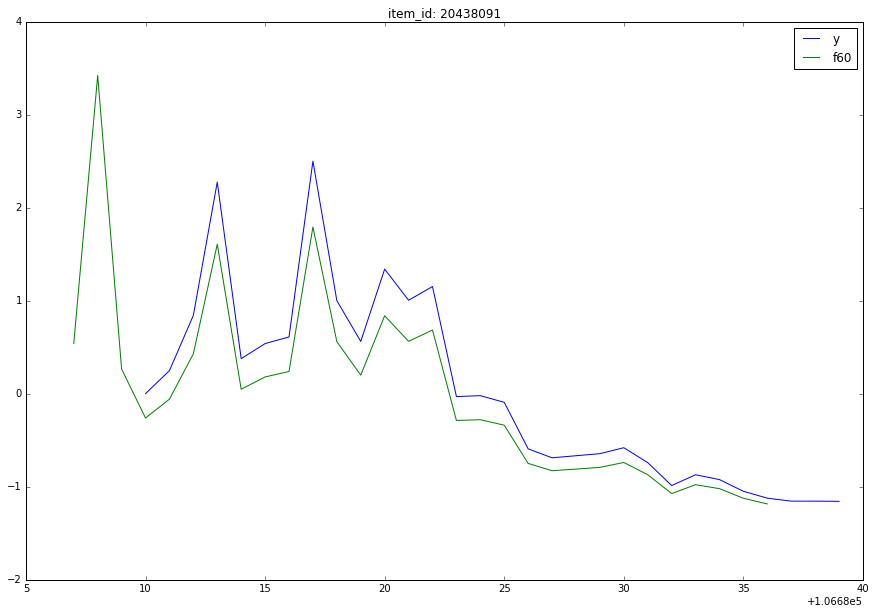

100796.830189 26519.5474254
63852.4716981 17150.2937327


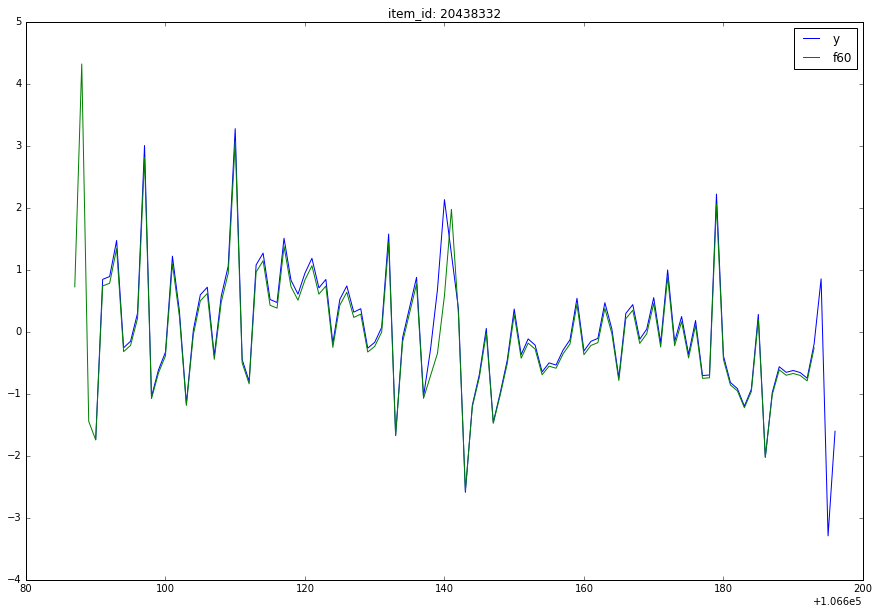

In [62]:
plt.figure(figsize=(15, 10))
shift = 3
for _id in np.unique(train['item_id'])[:30]:
    plt.figure(figsize=(15, 10))
    print_cluster_field(train, _id, time_shift=shift, field='y', norm=True)
    print_cluster_field(train, _id, time_shift=shift, field='f60', norm=True, offset=shift)
    plt.title('item_id: ' + str(_id))
    plt.legend()
    plt.show()

In [67]:
print(len(train), len(train[train['f19'] == train['f49']]))

72457 72457


In [68]:
print(test)

         Num  year  week  shift   item_id        f1        f2        f3  \
0     348622  2015     3      3  20447918     960.0     820.0    1128.0   
1     348623  2015     3      3  20447902    9086.0   12585.0   11595.0   
2     348624  2015     3      3  20447732  115087.0  147287.0  176065.0   
3     348625  2015     3      3  20443951   20900.0   24420.0   27068.0   
4     348626  2015     3      3  20443944    4430.0    5864.0    3310.0   
5     348627  2015     3      3  20443943   57289.0   80036.0  112511.0   
6     348628  2015     3      3  20443941   21868.0   30620.0   45886.0   
7     348629  2015     3      3  20443902   41105.0   57637.0   54540.0   
8     348630  2015     3      3  20443901   39381.0   56933.0   59899.0   
9     348631  2015     3      3  20443308    5922.0   16070.0   14665.0   
10    348632  2015     3      3  20443307    5120.0    9280.0    9015.0   
11    348633  2015     3      3  20443057   52035.0   64435.0   63748.0   
12    348634  2015     3 

73779.3333333 42380.3150243


C:\Users\Andrey\Anaconda3\lib\site-packages\ipykernel\__main__.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


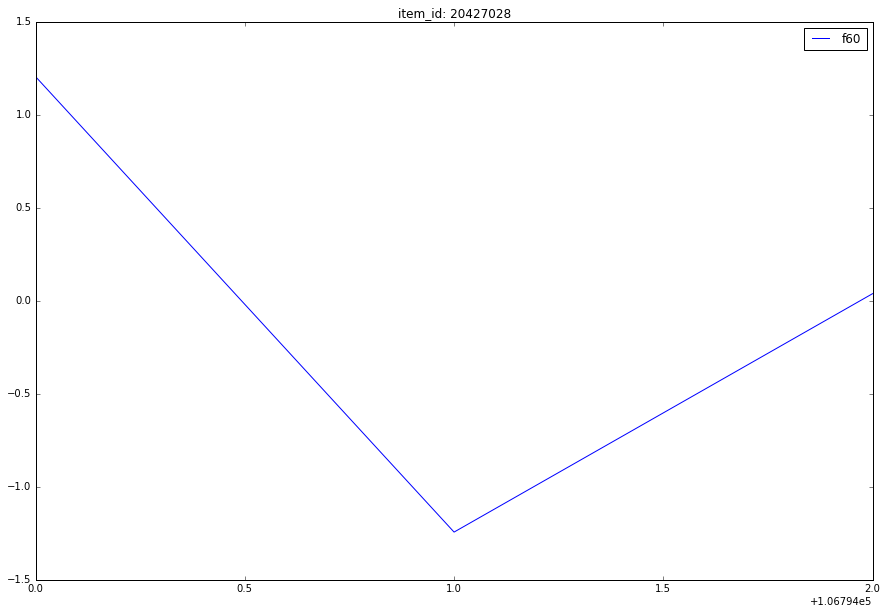

1496.0 848.303404842


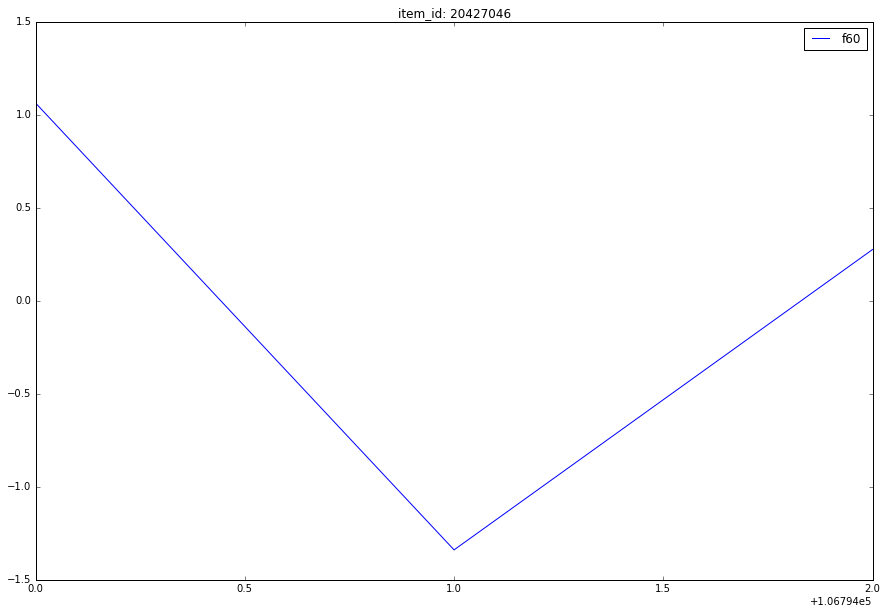

225.0 65.0


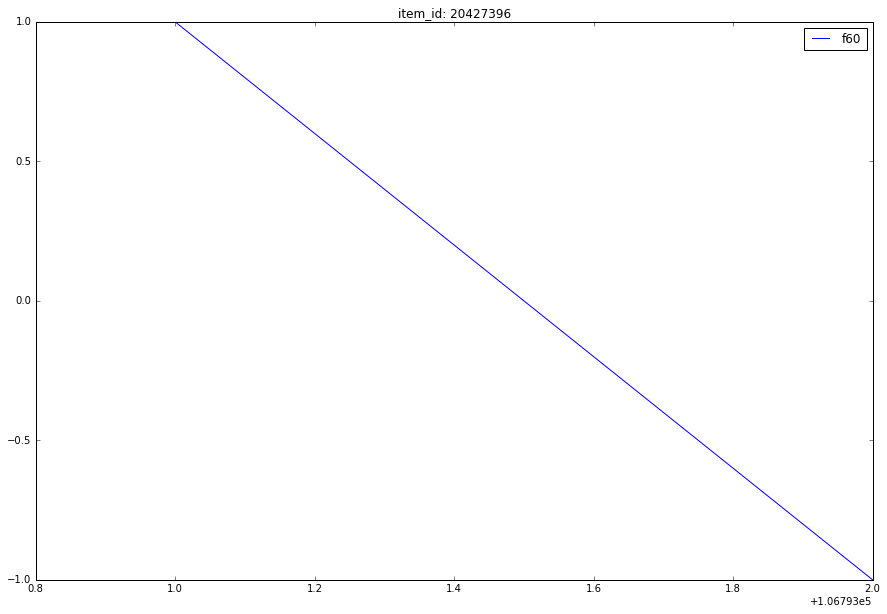

48467.3333333 24706.8982855


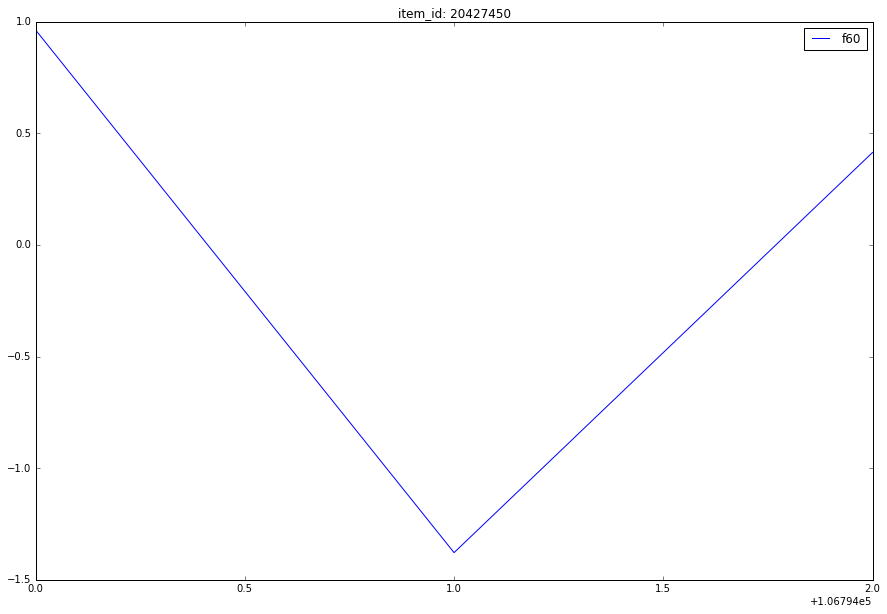

7131.33333333 3733.92522094


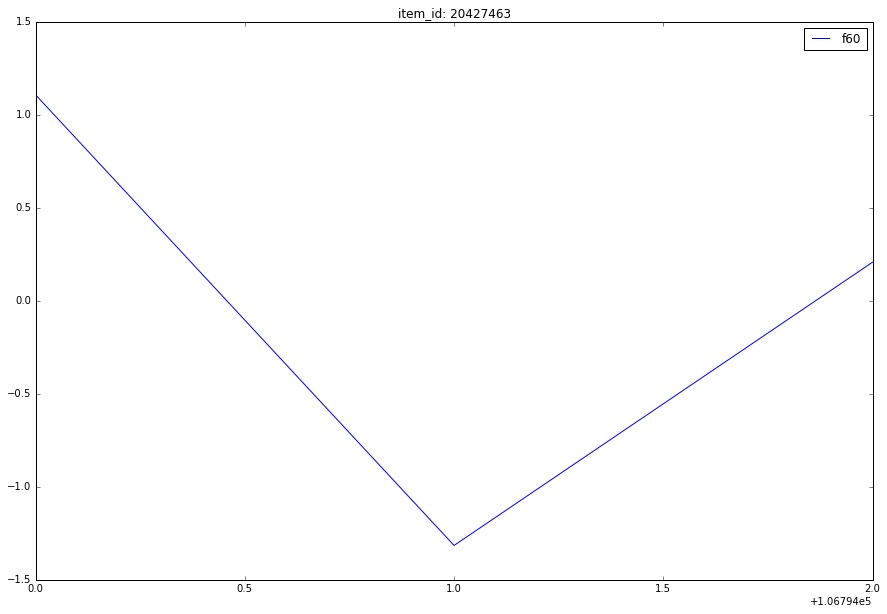

1226.0 720.357318743


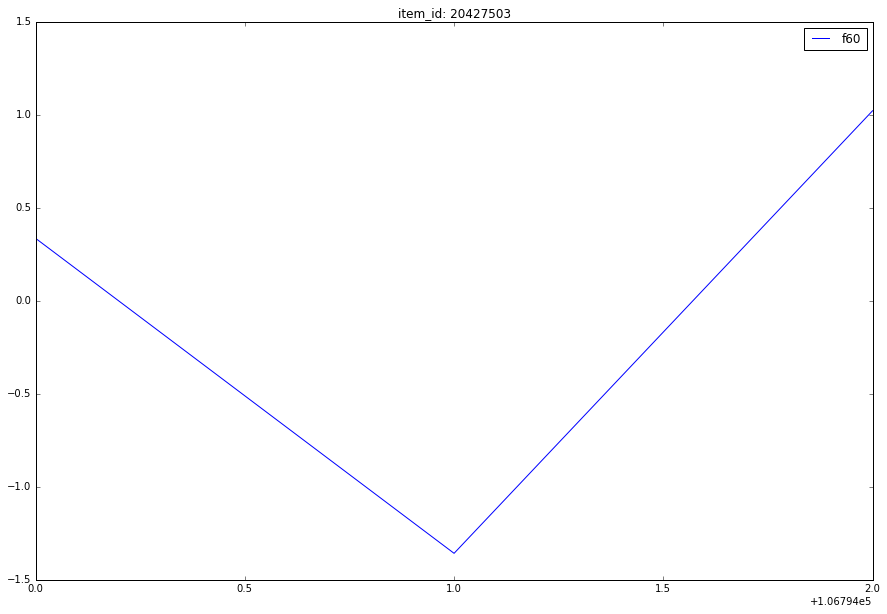

735.666666667 481.380191625


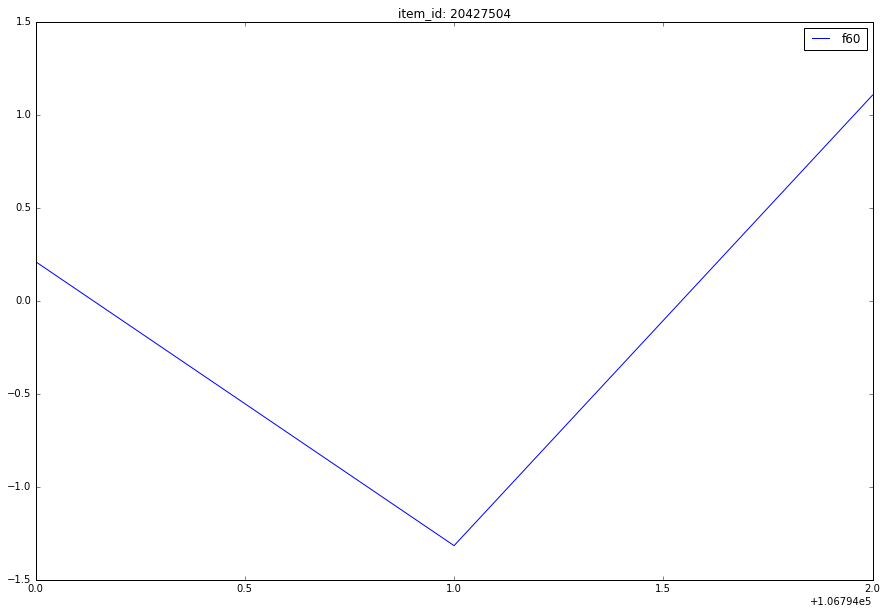

88092.6666667 52931.6118927


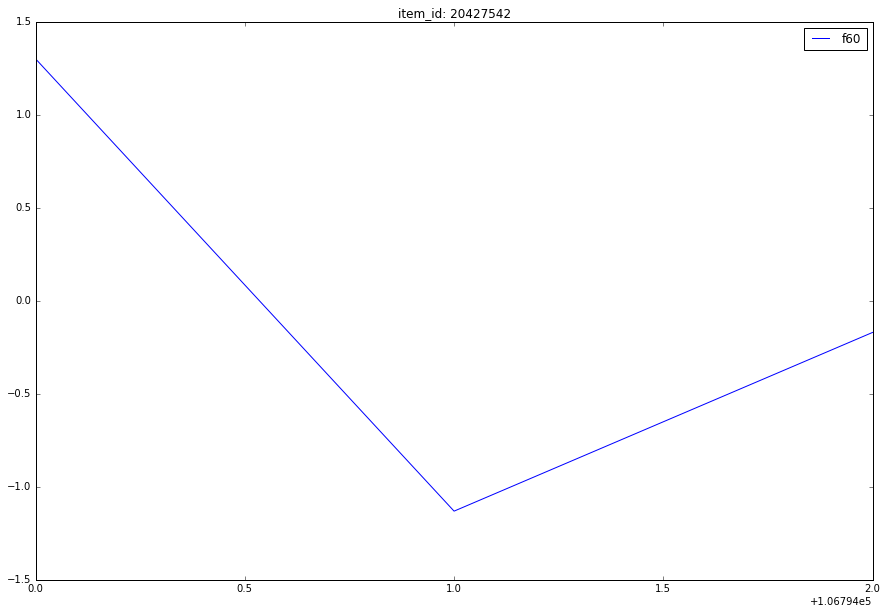

430671.666667 245111.2703


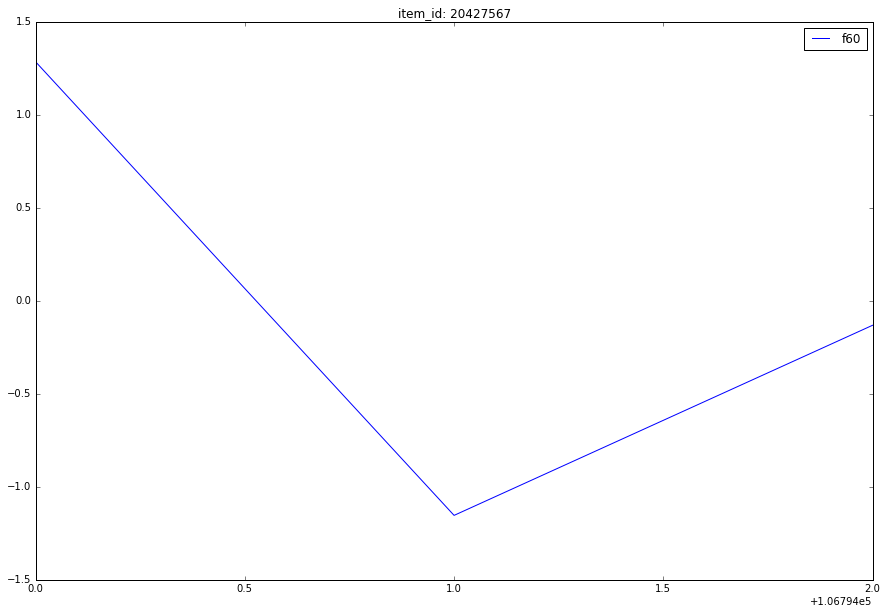

50560.3333333 28593.0956973


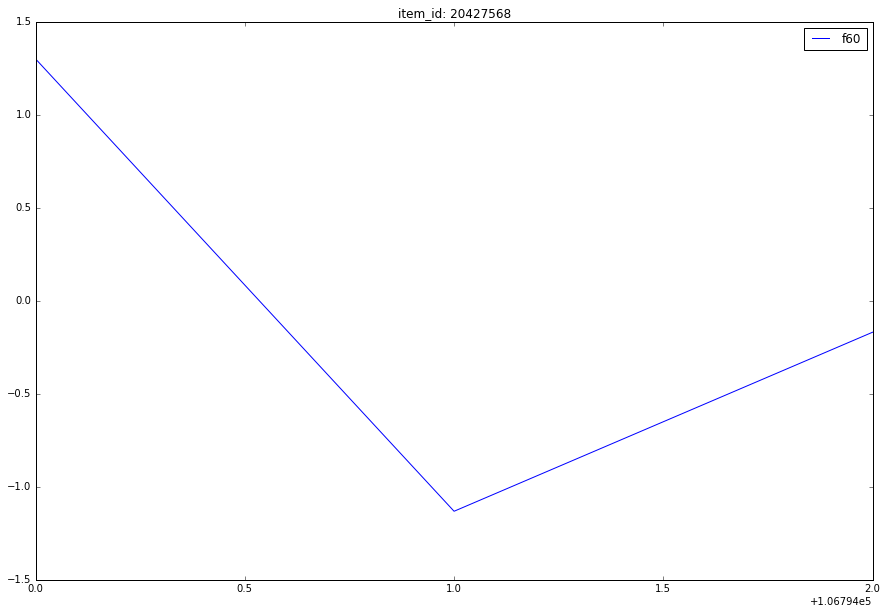

1458.33333333 757.160191476


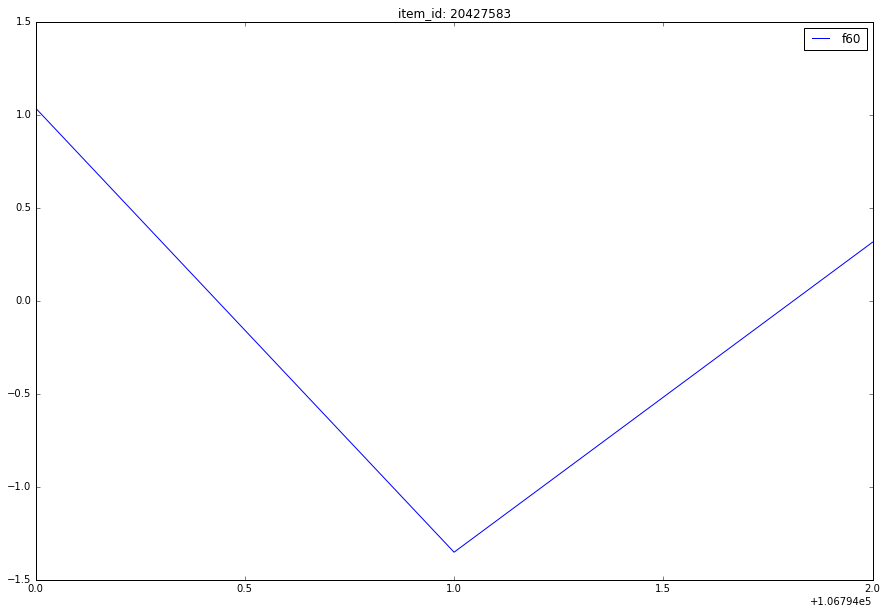

10532.3333333 4474.28365464


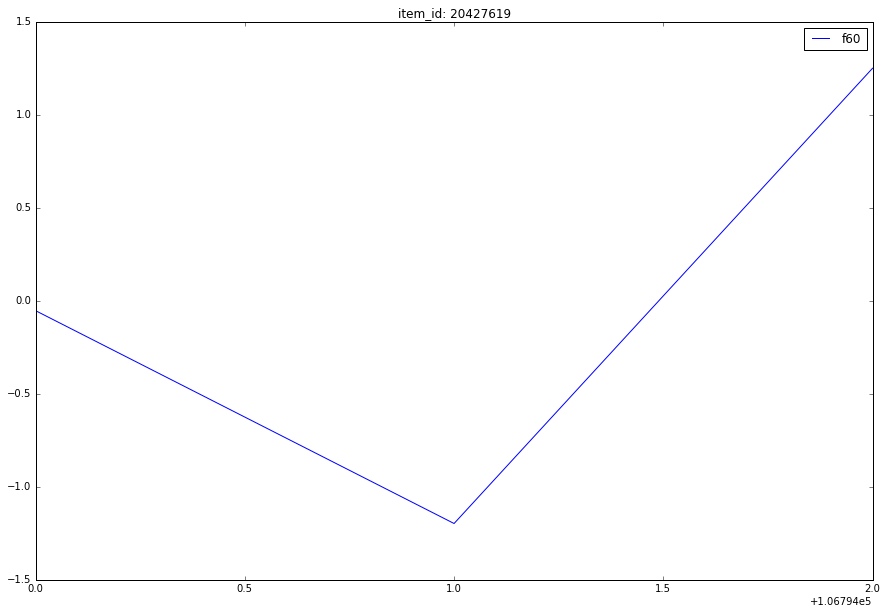

80.0 50.0


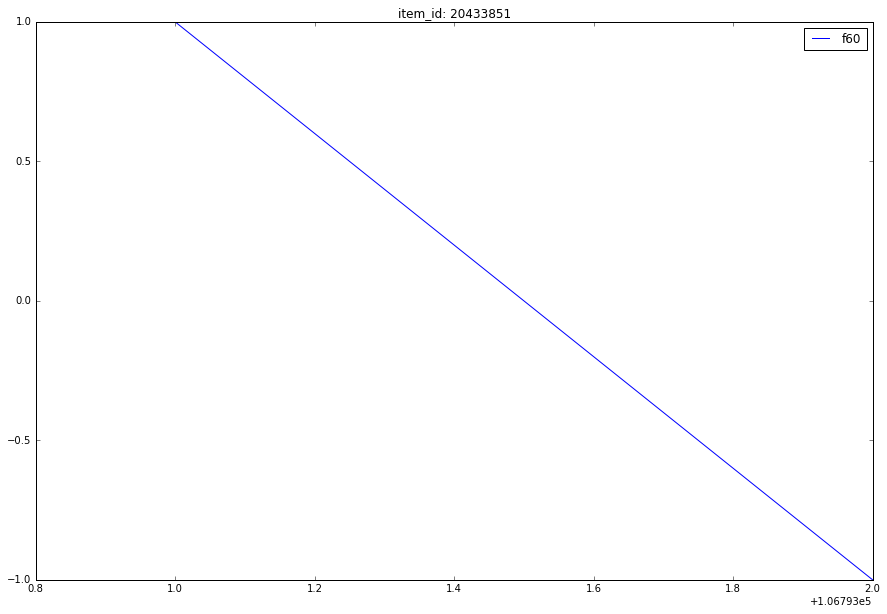

70.0 61.6441400297


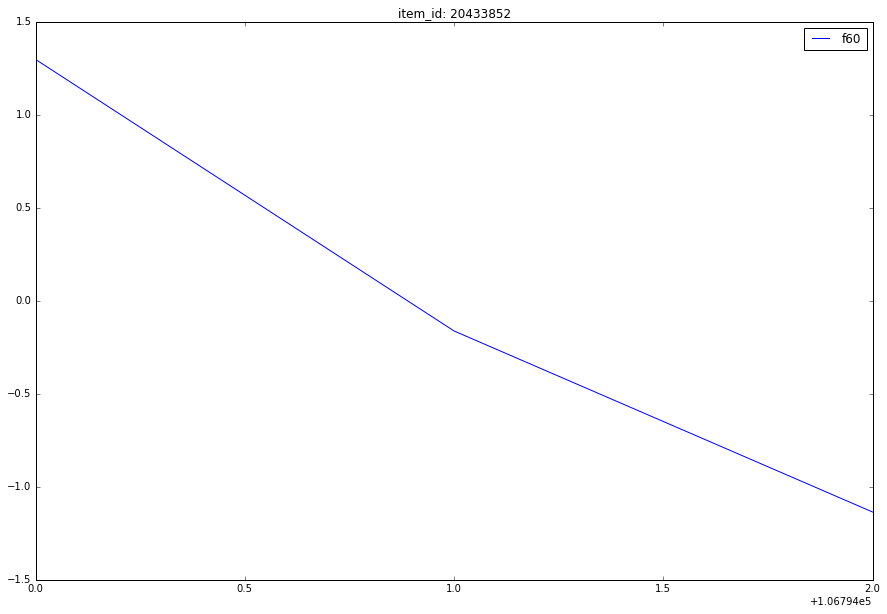

53670.3333333 30558.9021654


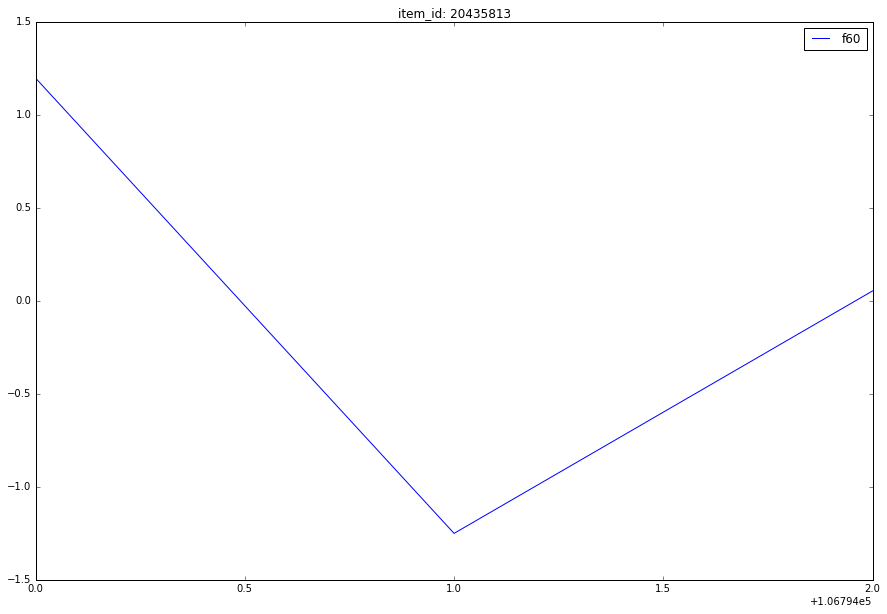

In [72]:
plt.figure(figsize=(15, 10))
shift = 3
for _id in np.unique(test['item_id'])[:15]:
    plt.figure(figsize=(15, 10))
    #print_cluster_field(test, _id, time_shift=shift, field='y', norm=True)
    print_cluster_field(test, _id, time_shift=shift, field='f60', norm=True, offset=shift)
    plt.title('item_id: ' + str(_id))
    plt.legend()
    plt.show()

In [90]:
def f60_to_y(f_60, f60_mean, f60_std, y_mean, y_std):
    return ((f_60 - f60_mean) / f60_std + y_mean) * y_std

def get_predictions(train):
    ids = np.unique(test[test['item_id']])
    #(item_id, f60_time, f60_val)
    _id = ids[0]
    train_foritem = train[train['item_id'] == _id]
    test_foritem = test[test['item_id'] == _id]
    time_f60 = []
    time_y = []
    times = get_real_times(train_foritem)
    times2 = get_times(train_foritem)
    for i in range(len(times)):
        time_f60.append((times[i], train['f60']))
        time_y.append((times2[i], train['y']))
    time_f60 = np.array(sorted(time_f60))
    
    mean = np.mean(train_foritem['f60'])
    std = np.std(train_foritem['f60'])
    
    ymean = np.mean(train_foritem['y'])
    ystd = np.std(train_foritem['y'])
    
    least_time = time_f60[-1, 0]
    
    #predictions = pd.dataframe(columns=['y'], np.zeros(len(train)))
    #print(predictions.shape)
    #print(predictions)
    predictions = []
    for t_y in time_y:
        predictions.append(t_y[0])
    
    for i in range(len(time_f60)):
        plt.plot(time_f60[:, 0], time_f60[:, 1], label=)

SyntaxError: invalid syntax (<ipython-input-90-b89875594253>, line 35)

In [194]:
# returns times->f60, f60's mean & std
def get_cluster_field(train,_id,field='f60'):
    trainC = train[train['item_id'] == _id]
    data = np.array(trainC[field])

    mean = np.mean(data)
    std = np.std(data)

    data = (data - mean)/std

    timeC = get_feature_times(trainC)
    prepared = dict()
#     print(len(np.unique(timeC)), len(timeC))
    for i in range(len(timeC)):
        #prepared.append((timeC[i],data[i]))
        prepared[timeC[i]] = data[i]
#     prepared = np.array(prepared)
    #prepared = np.array(sorted(prepared))
    #ox = prepared[:,0]
    #oy = prepared[:,1]
    #plt.plot(ox-offset,oy,label=field)
    return prepared, mean, std

def get_cluster_y_params(train,_id):
    trainC = train[train['item_id'] == _id]
    data = np.array(trainC['y'])

    return np.mean(data), np.std(data)

cccnt = 0

def get_y(fr, time_to_f60, f60_mean, f60_std, y_mean, y_std):
    f60 = 0
    if (get_feature_times(fr)[0] in time_to_f60.keys()):
        f60 = time_to_f60[get_feature_times(fr)[0]]
    else:
        # return last * .8 + mean * .2
        f60 = time_to_f60[max(time_to_f60.keys())]
        cccnt += 1
    return f60 * y_std + y_mean

def predict(train, test):
    prediction_pairs = []
    for _id in np.unique(test['item_id']):
        #pd.concat??????????
        time_to_f60, f60_mean, f60_std = get_cluster_field(pd.concat([train, test], axis=0), _id)
        y_mean, y_std = get_cluster_y_params(train, _id)
        #???
        frame = test[test['item_id'] == _id]
        for i in range(len(frame)):
            prediction_pairs.append((int(frame.iloc[[i]]['Num']), get_y(frame.iloc[[i]], time_to_f60, 
                                                                   f60_mean, f60_std, y_mean, y_std)))
    predictions = sorted(prediction_pairs)
    return predictions

In [195]:
#pd.concat([train, test], axis=0)
predictions3 = predict(train, test)


In [149]:
print(dict.fromkeys([1, 2], [3, 4]))

{1: [3, 4], 2: [3, 4]}


In [163]:
predictions[predictions < 0]

TypeError: unorderable types: list() < int()

In [176]:
preds = pd.DataFrame(data=predictions2, columns=['Num', 'y'])

In [162]:
preds.to_csv("cheated_submission.tsv", sep=',', index=False)

In [192]:
preds_ok = pd.DataFrame(data=predictions3, columns=['Num', 'y'])

In [196]:
print(cccnt)

0


In [198]:
preds_ok.to_csv("cheated_fixed__exploit_f60_submission.tsv", sep=',', index=False)

In [80]:
min(train['week'])

1

In [95]:
train = pd.read_csv("train.tsv")
test = pd.read_csv("test.tsv")

In [86]:
def calculate_feature_date(row):
    row[1] = row[1] - row[2];
    if (row[1] > 0):
        return row
    
    row[0] -= 1
    row[1] += 52
    return row

def get_y_date(data):
    return (data['year'] - 2000) * 53 + data['week']

In [96]:
train = train.drop(train.columns[range(6, 36)], axis=1)
test = test.drop(test.columns[range(5, 35)], axis=1)

In [100]:
X = train.drop('y', axis=1)
X[['year', 'week', 'shift']] = X[['year', 'week', 'shift']].apply(lambda x : calculate_feature_date(x), axis=1)
X = X.drop(['shift'], axis=1)
X = X[np.invert(X.duplicated(['item_id', 'year', 'week']))]

In [101]:
y = train[['y', 'year', 'week', 'item_id']]
y = y[np.invert(y.duplicated(['item_id', 'year', 'week']))]

In [102]:
df = pd.merge(X, y, on=['item_id', 'year', 'week'])
df

,Num,year,week,item_id,f31,f32,f33,f34,f35,f36,...,f52,f53,f54,f55,f56,f57,f58,f59,f60,y
0,3468,2012,52,20442092,270.0,980.0,6140.0,8292.0,780.0,426.0,...,151.0,220.0,220.0,450.0,290.0,240.0,210.0,830.0,730.0,1175
1,3469,2012,52,20442091,670.0,2830.0,11530.0,10397.0,260.0,960.0,...,400.0,350.0,500.0,480.0,505.0,310.0,230.0,930.0,730.0,1175
2,3470,2012,52,20442076,38056.0,40185.0,45733.0,59710.0,39982.0,45846.0,...,52590.0,31452.0,44420.0,41865.0,52705.0,36102.0,44163.0,45239.0,76670.0,123438
3,3471,2012,52,20441997,18817.0,20110.0,26368.0,31412.0,23182.0,24565.0,...,27850.0,21390.0,27090.0,23170.0,29705.0,19140.0,22055.0,23200.0,36280.0,58410
4,3472,2012,52,20441990,47480.0,47619.0,89708.0,166338.0,37620.0,85607.0,...,46412.0,29320.0,21140.0,28406.0,65056.0,31886.0,48750.0,36520.0,101820.0,163930
5,3473,2012,52,20441989,17146.0,20066.0,27070.0,35337.0,14575.0,18989.0,...,19780.0,7990.0,8230.0,10650.0,21920.0,13040.0,9780.0,9630.0,33480.0,53902
6,3474,2012,52,20441988,49262.0,50045.0,95167.0,102390.0,23802.0,44383.0,...,37168.0,13570.0,19760.0,20208.0,34745.0,18442.0,24700.0,21793.0,65820.0,105970
7,3475,2012,52,20441953,3020.0,2395.0,4015.0,5780.0,3468.0,3730.0,...,13448.0,3455.0,7205.0,8490.0,10790.0,7855.0,8150.0,7505.0,13150.0,21171
8,3476,2012,52,20441952,3930.0,4260.0,6836.0,12175.0,3390.0,4315.0,...,15275.0,4991.0,9025.0,12236.0,19830.0,8465.0,10770.0,13145.0,39210.0,63128
9,3477,2012,52,20441951,15220.0,12310.0,17270.0,20750.0,10085.0,14116.0,...,25385.0,11685.0,21389.0,16685.0,22805.0,14495.0,16462.0,19383.0,27330.0,44001


In [103]:
df['y_pred'] = df['f60'].apply(lambda x: math.floor(x * 1.61))
df['delta'] = df['y_pred'] - df['y']
df[df.delta!=0]

,Num,year,week,item_id,f31,f32,f33,f34,f35,f36,...,f54,f55,f56,f57,f58,f59,f60,y,y_pred,delta
23557,347282,2014,51,20443944,8030.0,4430.0,5864.0,3310.0,1853.0,2836.0,...,60.0,30.0,50.0,20.0,20.0,30.0,0.0,48,0,-48
23558,347478,2014,51,20438688,23551.0,21535.0,25121.0,24252.0,22213.0,23991.0,...,130.0,470.0,100.0,100.0,40.0,50.0,0.0,80,0,-80
23559,348222,2014,52,20442194,15098.0,20823.0,25070.0,19712.0,30635.0,25960.0,...,29115.0,19332.0,8962.0,2650.0,730.0,350.0,0.0,563,0,-563


In [108]:
X = test.copy()
X[['year', 'week', 'shift']] = X[['year', 'week', 'shift']].apply(lambda x : calculate_feature_date(x), axis=1)
X = X.drop(['shift'], axis=1)
X = X[np.invert(X.duplicated(['item_id', 'year', 'week']))]
X['y'] = X['f60'].apply(lambda x: math.floor(x * 1.61))

y = test.copy()[['Num', 'year', 'week', 'item_id']]
y = y[np.invert(y.duplicated(['item_id', 'year', 'week']))]

In [146]:
X = test.copy()
X[['year', 'week', 'shift']] = X[['year', 'week', 'shift']].apply(lambda x : calculate_feature_date(x), axis=1)
X = X[np.invert(X.duplicated(['item_id', 'year', 'week']))]
X = X.get(['year', 'week', 'item_id', 'f60'])

y = test.copy().get(['Num', 'week', 'year', 'item_id'])
df = pd.merge(X, y, on=['item_id', 'year', 'week'])

In [147]:
df['y']=df['f60'].apply(lambda x: math.floor(x*1.61))
df = df.sort_values('Num', ascending=True)

In [149]:
df = df[['Num', 'y']]
df.shape

(1335, 2)

In [148]:
test_known = df

In [150]:
nums_computed = set(df['Num'])

In [151]:
max(nums_computed) - min(nums_computed)

2466

In [220]:
df2 = test[[num not in nums_computed for num in test['Num']]]

In [221]:
df2.shape[0] + df.shape[0]

2016

In [232]:
np.unique(np.array(test_known[test_known['item_id'] == 20447919]['y']))

array([1899, 1948], dtype=int64)

In [222]:
df2['y'] = df2.apply(lambda row: np.unique(np.array(test_known[test_known['item_id'] == row[4]]['y']))[-1:].mean(), axis=1)

C:\Users\Andrey\Anaconda3\lib\site-packages\numpy\core\_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
C:\Users\Andrey\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [223]:
df2[df2['y'].isnull()]

,Num,year,week,shift,item_id,f31,f32,f33,f34,f35,...,f52,f53,f54,f55,f56,f57,f58,f59,f60,y
626,349919,2015,4,3,20439124,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1078,350591,2015,4,2,20439124,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1524,351037,2015,4,1,20439124,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [226]:
df2 = df2.fillna(16)

In [227]:
#train[train['item_id'] == 20439124]
df2

,Num,year,week,shift,item_id,f31,f32,f33,f34,f35,...,f52,f53,f54,f55,f56,f57,f58,f59,f60,y
455,349748,2015,4,3,20443944,5864.0,3310.0,1853.0,2836.0,2807.0,...,60.0,30.0,50.0,20.0,20.0,30.0,0.0,0.0,0.0,16.0
607,349900,2015,4,3,20433851,160.0,350.0,200.0,380.0,150.0,...,70.0,20.0,80.0,50.0,30.0,80.0,270.0,130.0,30.0,193.0
608,349901,2015,4,3,20427396,350.0,290.0,170.0,380.0,280.0,...,20.0,100.0,20.0,20.0,20.0,110.0,330.0,290.0,160.0,144.0
625,349918,2015,4,3,20439005,30.0,10.0,29.0,20.0,20.0,...,5.0,20.0,0.0,10.0,15.0,0.0,30.0,5.0,0.0,32.0
626,349919,2015,4,3,20439124,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0
653,349946,2015,4,3,20438687,19881.0,18244.0,16860.0,17080.0,16750.0,...,644.0,1560.0,1190.0,280.0,250.0,90.0,40.0,40.0,0.0,193.0
654,349947,2015,4,3,20438688,25121.0,24252.0,22213.0,23991.0,18690.0,...,130.0,470.0,100.0,100.0,40.0,50.0,0.0,0.0,0.0,257.0
907,350420,2015,4,2,20443944,3310.0,1853.0,2836.0,2807.0,2550.0,...,30.0,50.0,20.0,20.0,30.0,0.0,0.0,0.0,10.0,16.0
1059,350572,2015,4,2,20433851,350.0,200.0,380.0,150.0,230.0,...,20.0,80.0,50.0,30.0,80.0,270.0,130.0,30.0,70.0,193.0
1060,350573,2015,4,2,20427396,290.0,170.0,380.0,280.0,230.0,...,100.0,20.0,20.0,20.0,110.0,330.0,290.0,160.0,0.0,144.0


In [216]:
df_trans = df2.copy()
df2 = df2[['Num', 'y']]

In [217]:
df2 = df2.sort_values('Num', ascending=True)

In [218]:
ans = pd.concat([df, df2], axis=0)
ans.shape

(2016, 2)

In [219]:
ans = ans.sort_values('Num', ascending=True)

In [213]:
ans

,Num,y
42,348622,1497.0
0,348623,27033.0
3,348624,297560.0
6,348625,29471.0
9,348626,16.0
12,348627,146242.0
15,348628,67735.0
18,348629,111941.0
21,348630,102631.0
24,348631,3542.0


In [214]:
ans.to_csv('cheat_and_tail_equals_last_known.tsv', sep=',', index=False)